----------------------------------
# Background & Context: **Cars4U** 
## Daniyal Nathani
----------------------------------

## Context: 
There is a huge demand for used cars in the Indian Market today. As sales of new cars have slowed down in the recent past, the pre-owned car market has continued to grow over the past years and is larger than the new car market now. Cars4U is a budding tech start-up that aims to find footholes in this market.
In 2018-19, while new car sales were recorded at 3.6 million units, around 4 million second-hand cars were bought and sold. There is a slowdown in new car sales and that could mean that the demand is shifting towards the pre-owned market. In fact, some car sellers replace their old cars with pre-owned cars instead of buying new ones. Unlike new cars, where price and supply are fairly deterministic and managed by OEMs (Original Equipment Manufacturer / except for dealership level discounts which come into play only in the last stage of the customer journey), used cars are very different beasts with huge uncertainty in both pricing and supply. Keeping this in mind, the pricing scheme of these used cars becomes important in order to grow in the market.

As a senior data scientist at Cars4U, you have to come up with a pricing model that can effectively predict the price of used cars and can help the business in devising profitable strategies using differential pricing. For example, if the business knows the market price, it will never sell anything below it. 

## Objective: 
1.	Explore and visualize the dataset. 
2.	Build a linear regression model to predict the prices of used cars. 
3.	Generate a set of insights and recommendations that will help the business.

## Data Dictionary: 
1.	S.No. : Serial Number 
2.	Name : Name of the car which includes Brand name and Model name 
3.	Location : The location in which the car is being sold or is available for purchase Cities 
4.	Year : Manufacturing year of the car 
5.	Kilometers_driven : The total kilometers driven in the car by the previous owner(s) in KM. 
6.	Fuel_Type : The type of fuel used by the car. (Petrol, Diesel, Electric, CNG, LPG) 
7.	Transmission : The type of transmission used by the car. (Automatic / Manual) 
8.	Owner : Type of ownership
9.	Mileage : The standard mileage offered by the car company in kmpl or km/kg 
10.	Engine : The displacement volume of the engine in CC. 
11.	Power : The maximum power of the engine in bhp. 
12.	Seats : The number of seats in the car. 
13.	New_Price : The price of a new car of the same model in INR Lakhs.(1 Lakh = 100, 000) 
14.	Price : The price of the used car in INR Lakhs (1 Lakh = 100, 000) 
 
## Best Practices for Notebook : 
- The notebook should be well-documented, with inline comments explaining the functionality of code and markdown cells containing comments on the observations and insights.
- The notebook should be run from start to finish in a sequential manner before submission.
- It is preferable to remove all warnings and errors before submission.

## Concepts to Cover:
1. Overview of the data
2. Data Visualization
3. Data Preparation
4. Choose Model, Train and Evaluate
5. Conclusion
6. Linear Regression Assumptions



# Let's start coding!

**Importing necessary libraries**

In [1]:
import numpy as np
np.set_printoptions(suppress=True)
import pandas as pd 
pd.set_option('display.max_columns', None) # Removes the limit from the number of displayed columns and rows so I can see the entire dataframe when I print it
#pd.set_option('display.max_rows', None)
#pd.set_option('display.max_rows', 200)
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline
import missingno as mno
import warnings
warnings.filterwarnings("ignore")
from sklearn.linear_model import LinearRegression 
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import norm
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
import pandas_profiling


** Importing dataset**

In [2]:
data = pd.read_csv("used_cars_data.csv")

**First look at data**

In [3]:
data.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
0,0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,NaN,1.75
1,1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,NaN,12.50
2,2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,8.61 Lakh,4.50
3,3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,NaN,6.00
4,4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,NaN,17.74


*From a first glance of the first 5 rows, I see there are already some null values as well as units in the Mileage, Engine, Power, and New_Price columns that are going to needed to be removed.*



<AxesSubplot:>

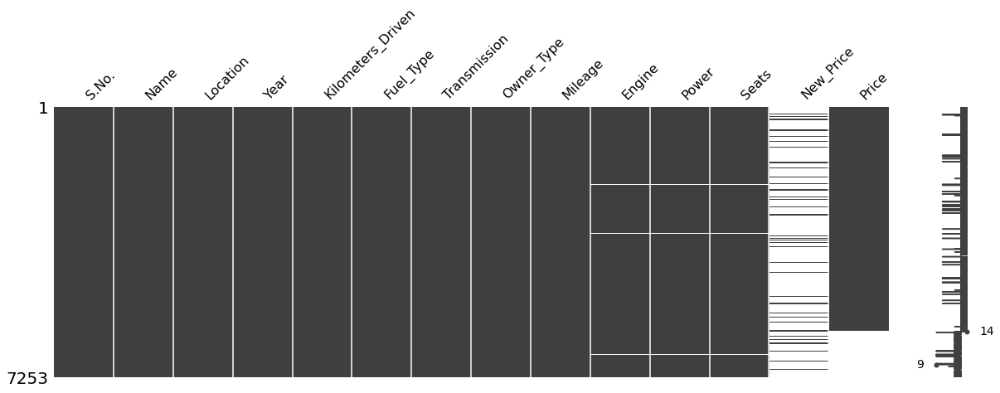

In [4]:
mno.matrix(data, figsize = (20, 6))

*With this visualization, we can see that a large portion of the New_Price values are completely missing. The same rows have the Engine, Power, & Seats data missing.*

In [5]:
print('-----------------Used Cars DATAFRAME INFO-------------')

print('\nThe shape of the data set is:', data.shape)

BDFigures = []
for col in data.columns :
    BDFigures.append([col,data[col].dtype,
                     data[col].isna().sum(),
                     round((data[col].isna().sum()/len(data[col])) * 100,2),
                     data[col].nunique(),
                     list(data[col].sample(5).drop_duplicates().values)]);
dfTable = pd.DataFrame(columns=['dataFeatures', 'dataType', 'null', 'nullPct', 'unique', 'uniqueSample'],
                     data=BDFigures)
display(dfTable)



-----------------Used Cars DATAFRAME INFO-------------

The shape of the data set is: (7253, 14)


,dataFeatures,dataType,null,nullPct,unique,uniqueSample
0,S.No.,int64,0,0.00,7253,"[644, 2711, 3471, 5169, 4775]"
1,Name,object,0,0.00,2041,"[Maruti Swift Dzire VDI, Toyota Corolla Altis ..."
2,Location,object,0,0.00,11,"[Pune, Bangalore, Jaipur, Kochi]"
3,Year,int64,0,0.00,23,"[2015, 2017]"
4,Kilometers_Driven,int64,0,0.00,3660,"[43000, 65668, 21214, 51806, 42000]"
5,Fuel_Type,object,0,0.00,5,"[Diesel, Petrol]"
6,Transmission,object,0,0.00,2,[Manual]
7,Owner_Type,object,0,0.00,4,[First]
8,Mileage,object,2,0.03,450,"[22.54 kmpl, 20.38 kmpl, 17.05 kmpl, 21.27 kmp..."
9,Engine,object,46,0.63,150,"[1498 CC, 1598 CC, 799 CC, 2982 CC, 1197 CC]"


*From here, we can see that the datatypes don't all align properly as numbers - primarily because they have units attached. The most startling data from this visualization is the amount of missing data (86%!) in the New Price column. We have to keep this in mind moving forward on our analysis.. may not be a good idea to include in the overall model.*

In [6]:
print("\nPrimary Numerical Analysis:")
display(data.describe(include='all').T)


Primary Numerical Analysis:


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
S.No.,7253,NaN,NaN,NaN,3626,2093.91,0,1813,3626,5439,7252
Name,7253,2041,Mahindra XUV500 W8 2WD,55,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Location,7253,11,Mumbai,949,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,7253,NaN,NaN,NaN,2013.37,3.25442,1996,2011,2014,2016,2019
Kilometers_Driven,7253,NaN,NaN,NaN,58699.1,84427.7,171,34000,53416,73000,6.5e+06
Fuel_Type,7253,5,Diesel,3852,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Transmission,7253,2,Manual,5204,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Owner_Type,7253,4,First,5952,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mileage,7251,450,17.0 kmpl,207,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Engine,7207,150,1197 CC,732,NaN,NaN,NaN,NaN,NaN,NaN,NaN


*From here, we see a little overview of the numerical data. The serial number seems evenly distributed so it can be dropped. Kilometers driven has a ridiculously high max value much further away from the rest of the data. Mileage, Engine, & Power numerical analysis will have to be done after we strip them and apply the proper datatype format.*

In [7]:
data.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
0,0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,NaN,1.75
1,1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,NaN,12.50
2,2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,8.61 Lakh,4.50
3,3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,NaN,6.00
4,4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,NaN,17.74


## Data Preprocssing, Cleaning, & Features Engineering
1. **Removing Serial Number column. This column won't be helping with the predictions.**
2. **Investigating ridiculously high amount of kilometers driven.**
3. **Investigating zero values of seats**
4. **Extracting Brand & Model Columns while dropping Name Column**
5. **Cleaning Data and Converting datatypes**
6. **Let's deal with our missing values and then move on to dealing with outliers and distribution skewness.**

7. **Outlier & Distrbution analysis using Univariate analysis**



1. **Removing Serial Number column. This column won't be helping with the predictions.**

In [8]:
data.drop('S.No.', axis=1, inplace=True) #

2. **Investigating ridiculously high amount of kilometers driven.**


In [9]:
data.nlargest(5, ['Kilometers_Driven'])

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
2328,BMW X5 xDrive 30d M Sport,Chennai,2017,6500000,Diesel,Automatic,First,15.97 kmpl,2993 CC,258 bhp,5.0,NaN,65.0
340,Skoda Octavia Ambition Plus 2.0 TDI AT,Kolkata,2013,775000,Diesel,Automatic,First,19.3 kmpl,1968 CC,141 bhp,5.0,NaN,7.5
1860,Volkswagen Vento Diesel Highline,Chennai,2013,720000,Diesel,Manual,First,20.54 kmpl,1598 CC,103.6 bhp,5.0,NaN,5.9
358,Hyundai i10 Magna 1.2,Chennai,2009,620000,Petrol,Manual,First,20.36 kmpl,1197 CC,78.9 bhp,5.0,NaN,2.7
2823,Volkswagen Jetta 2013-2015 2.0L TDI Highline AT,Chennai,2015,480000,Diesel,Automatic,First,16.96 kmpl,1968 CC,138.03 bhp,5.0,NaN,13.0


In [10]:
# Dropping this row would be the best option as we can see it is a complete outlier - much further away from the closest values. The car is only from 2017 as well. Highly improbable scenario.
data.drop([2328], axis=0, inplace=True)

3. **Investigating zero values of seats**


In [11]:
data.nsmallest(5, ['Seats'])

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
3999,Audi A4 3.2 FSI Tiptronic Quattro,Hyderabad,2012,125000,Petrol,Automatic,First,10.5 kmpl,3197 CC,null bhp,0.0,NaN,18.00
134,Mercedes-Benz SLC 43 AMG,Kolkata,2017,13372,Petrol,Automatic,First,19.0 kmpl,2996 CC,362.07 bhp,2.0,95.04 Lakh,54.00
557,Audi TT 2.0 TFSI,Delhi,2013,12100,Petrol,Automatic,First,9.9 kmpl,1984 CC,207.8 bhp,2.0,NaN,29.50
693,Mercedes-Benz SLK-Class SLK 350,Coimbatore,2016,22732,Petrol,Automatic,First,18.1 kmpl,3498 CC,306 bhp,2.0,NaN,55.54
798,Mercedes-Benz SLK-Class SLK 350,Bangalore,2015,10000,Petrol,Automatic,First,18.1 kmpl,3498 CC,306 bhp,2.0,NaN,55.00


In [12]:
#From industry knowledge, I know that an Audi A4 from 2012 has 4 seats. Therefore, I am imputing the value of 4 for this record
data['Seats'] = data['Seats'].replace(['0',0], 4)

data.nsmallest(5, ['Seats'])

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
134,Mercedes-Benz SLC 43 AMG,Kolkata,2017,13372,Petrol,Automatic,First,19.0 kmpl,2996 CC,362.07 bhp,2.0,95.04 Lakh,54.00
557,Audi TT 2.0 TFSI,Delhi,2013,12100,Petrol,Automatic,First,9.9 kmpl,1984 CC,207.8 bhp,2.0,NaN,29.50
693,Mercedes-Benz SLK-Class SLK 350,Coimbatore,2016,22732,Petrol,Automatic,First,18.1 kmpl,3498 CC,306 bhp,2.0,NaN,55.54
798,Mercedes-Benz SLK-Class SLK 350,Bangalore,2015,10000,Petrol,Automatic,First,18.1 kmpl,3498 CC,306 bhp,2.0,NaN,55.00
915,Smart Fortwo CDI AT,Pune,2008,103000,Diesel,Automatic,Second,0.0 kmpl,799 CC,null bhp,2.0,NaN,3.00


4. **Extracting Brand & Model Columns while dropping Name Column**


In [13]:
data['Brand'] = data.Name.str.split().str.get(0)
data['Model'] = data.Name.str.split().str.get(1)

data.drop('Name',axis=1,inplace=True)


In [14]:
# Defining function snippet to reoder the Brand & Model columns to the front
def movecol(df, cols_to_move=[], ref_col='', place=''):
    
    cols = df.columns.tolist()
    
    if place == 'After':
        seg1 = cols[:list(cols).index(ref_col) + 1]
        seg2 = cols_to_move
    if place == 'Before':
        seg1 = cols[:list(cols).index(ref_col)]
        seg2 = cols_to_move + [ref_col]
    
    seg1 = [i for i in seg1 if i not in seg2]
    seg3 = [i for i in cols if i not in seg1 + seg2]
    
    return(df[seg1 + seg2 + seg3])

data = movecol(data, cols_to_move=['Brand','Model'], ref_col='Location', place='Before')

display(data.head())

,Brand,Model,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
0,Maruti,Wagon,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,NaN,1.75
1,Hyundai,Creta,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,NaN,12.50
2,Honda,Jazz,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,8.61 Lakh,4.50
3,Maruti,Ertiga,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,NaN,6.00
4,Audi,A4,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,NaN,17.74


In [15]:
#display(pd.DataFrame(data['Brand','Model'].isnull().sum(), columns= ['Number of null values']))
#display(pd.DataFrame(data['Brand'].isnull().sum(), columns= ['Number of null values']))
print("Number of Unique Brands:", data['Brand'].nunique())
print("Number of Unique Models:", data['Model'].nunique())

Number of Unique Brands: 33
Number of Unique Models: 219


*A little bit of analysis on the new extracted feature. There are 33 unique brands. Let's check how many models there are per brand.*

In [16]:
print("Number of models per brand:")
data.groupby('Brand')['Model'].nunique()


Number of models per brand:


Brand
Ambassador        1
Audi             10
BMW              10
Bentley           2
Chevrolet         9
Datsun            3
Fiat              7
Force             1
Ford             11
Hindustan         1
Honda            12
Hyundai          15
ISUZU             1
Isuzu             2
Jaguar            4
Jeep              1
Lamborghini       1
Land              1
Mahindra         16
Maruti           24
Mercedes-Benz    19
Mini              3
Mitsubishi        5
Nissan            7
OpelCorsa         1
Porsche           4
Renault           8
Skoda             6
Smart             1
Tata             15
Toyota            9
Volkswagen        8
Volvo             5
Name: Model, dtype: int64

*We can see that a lot of the brands have only 1 car in this dataset. Maruti brand cars are the most seen in the dataset.* 

5. **Cleaning Data and Converting datatypes**

In [17]:
data.dtypes

Brand                 object
Model                 object
Location              object
Year                   int64
Kilometers_Driven      int64
Fuel_Type             object
Transmission          object
Owner_Type            object
Mileage               object
Engine                object
Power                 object
Seats                float64
New_Price             object
Price                float64
dtype: object

In [18]:
#We need to do some work on Data Cleaning before we can change the datatypes

#data["Mileage"]=pd.to_numeric(data["Mileage"])

#data["Engine"]=pd.to_numeric(data["Engine"])

#data["Power"]=pd.to_numeric(data["Power"])

#data["New_Price"]=pd.to_numeric(data["New_Price"])

5.1 **Removing non-numerical parts in Milage, Engine and Power columns**

In [19]:
data['Engine'] = data['Engine'].str.split().str[0]
data['Power'] = data['Power'].str.split().str[0]
data['Mileage'] = data['Mileage'].str.split().str[0]
#data["New_Price"]=pd.to_numeric(data["New_Price"])

In [20]:
data["Mileage"]=pd.to_numeric(data["Mileage"])

display(data['Mileage'].describe().T)

count    7250.00000
mean       18.14188
std         4.56244
min         0.00000
25%        15.17000
50%        18.16000
75%        21.10000
max        33.54000
Name: Mileage, dtype: float64

In [21]:
#A mileage of zero shouldn't be possible, therefore I am replacing these values with nan to be later replaced with mean or median

data['Mileage'] = data['Mileage'].replace(['0', 0], np.nan)

display(data['Mileage'].describe().T)

count    7169.000000
mean       18.346859
std         4.158106
min         6.400000
25%        15.300000
50%        18.200000
75%        21.100000
max        33.540000
Name: Mileage, dtype: float64

In [22]:
data["Engine"]=pd.to_numeric(data["Engine"])

data['Engine'].describe().T

count    7206.000000
mean     1616.382459
std       595.105530
min        72.000000
25%      1198.000000
50%      1493.000000
75%      1968.000000
max      5998.000000
Name: Engine, dtype: float64

In [23]:
#data["Power"]=pd.to_numeric(data["Power"])

#We need to replace the 'null' values before we can change this data type

data['Power'] = data['Power'].replace(['null'], np.nan)

data['Power']=pd.to_numeric(data['Power'])

data['Power'].describe().T

count    7077.000000
mean      112.744692
std        53.469461
min        34.200000
25%        75.000000
50%        94.000000
75%       138.100000
max       616.000000
Name: Power, dtype: float64

5.2 **Chaning New_price data according to the units. Most are in lakhs, but few are in Cr. (100 lakhs in 1 Cr)**


In [24]:
# Here, we change the New_Price data where it says Cr to lakhs. 100 lakhs in 1 Cr

Correct_Newprice= []
for i in data.New_Price:
    if str(i).endswith('Cr'):
        i = i[:-2]
        i = float(i)*100
        Correct_Newprice.append(float(i))
    elif str(i).endswith('Lakh'):
        i = i[:-4]
        #print(i)
        Correct_Newprice.append(float(i))
    else:
        Correct_Newprice.append(i)

data['New_Price'] = Correct_Newprice
data['New_Price'].describe().T


count    1006.000000
mean       22.779692
std        27.759344
min         3.910000
25%         7.885000
50%        11.570000
75%        26.042500
max       375.000000
Name: New_Price, dtype: float64

In [25]:
data.dtypes

Brand                 object
Model                 object
Location              object
Year                   int64
Kilometers_Driven      int64
Fuel_Type             object
Transmission          object
Owner_Type            object
Mileage              float64
Engine               float64
Power                float64
Seats                float64
New_Price            float64
Price                float64
dtype: object

*Confirming the datatypes have been converted*

6. **Let's deal with our missing values and then move on to dealing with outliers and distribution skewness.**

<AxesSubplot:>

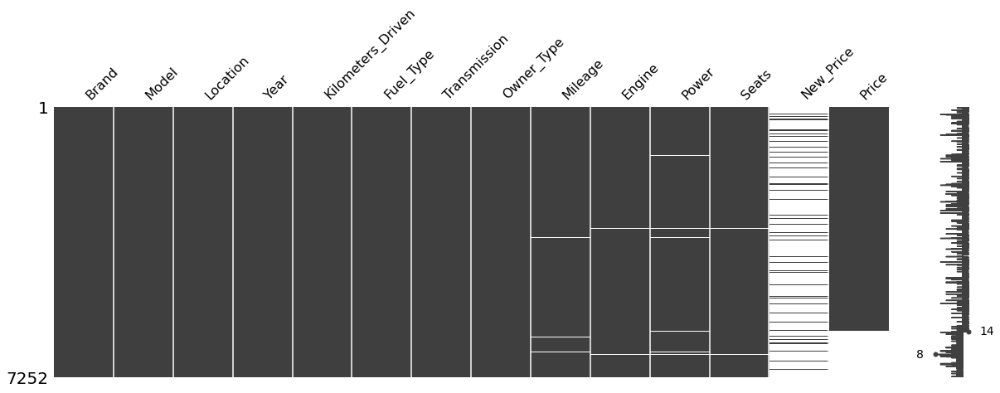

In [26]:
mno.matrix(data, figsize = (20, 6))

In [27]:
display(pd.DataFrame(data.isnull().sum(), columns= ['Number of null values']))

,Number of null values
Brand,0
Model,0
Location,0
Year,0
Kilometers_Driven,0
Fuel_Type,0
Transmission,0
Owner_Type,0
Mileage,83
Engine,46


In [28]:
cols_with_missing = [col for col in data.columns
                     if data[col].isnull().any()]
print("Columns with missing values:")
print(cols_with_missing)



Columns with missing values:
['Mileage', 'Engine', 'Power', 'Seats', 'New_Price', 'Price']


In [29]:
# For mileage, we are imputing values based on the Brand's mileage mean. The mean is a better value to use over the median because it captures the average rather than selecting the middle value. Certain brands tend to focus more on economical driving so the Brand's mileage mean value would be better than the overall mileage mean.

data['Mileage'] = data['Mileage'].fillna(data.groupby('Brand')['Mileage'].transform('mean'))

print('Number of missing values after imputation: ', data.Mileage.isnull().sum())


Number of missing values after imputation:  1


In [30]:
# Check to see where there is still a missing value
data[data['Mileage'].isnull()]

,Brand,Model,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
915,Smart,Fortwo,Pune,2008,103000,Diesel,Automatic,Second,NaN,799.0,NaN,2.0,NaN,3.0


In [31]:
#Smart brand has only 1 model and the mileage is none. Therefore, for this record, we are using the mean of all the values.

data['Mileage'] = data['Mileage'].fillna(data['Mileage'].mean())

print('Number of missing values after imputation: ', data.Mileage.isnull().sum())


Number of missing values after imputation:  0


In [32]:
# For Engine, we are imputing values based on the Brand's Engine mean because cars within the  same brand show similarity in displacement volume of the engine.

data['Engine'] = data['Engine'].fillna(data.groupby('Brand')['Engine'].transform('mean'))

print('Number of missing values after imputation: ', data.Engine.isnull().sum())


Number of missing values after imputation:  0


In [33]:
# For Power, we are imputing values based on the Brand's Power mean because cars within the  same brand show similarity in maximum power of the engine.

data['Power'] = data['Power'].fillna(data.groupby('Brand')['Power'].transform('mean'))

print('Number of missing values after imputation: ', data.Power.isnull().sum())

Number of missing values after imputation:  2


In [34]:
data[data['Power'].isnull()]

,Brand,Model,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
915,Smart,Fortwo,Pune,2008,103000,Diesel,Automatic,Second,18.333198,799.0,NaN,2.0,NaN,3.0
6216,Hindustan,Motors,Pune,1996,65000,Diesel,Manual,Second,14.100000,1995.0,NaN,5.0,NaN,NaN


In [35]:
#These brands have only 1 model and the power is null. Therefore, for this record, we are using the mean of all the values.

data['Power'] = data['Power'].fillna(data['Power'].mean())

print('Number of missing values after imputation: ', data.Power.isnull().sum())

Number of missing values after imputation:  0


In [36]:
# For Seats, we are imputing values based on the Brand's Seat median because cars within the  same brand show similarity in the number of seats.

data['Seats'] = data['Seats'].fillna(data.groupby('Brand')['Seats'].transform('median'))

print('Number of missing values after imputation: ', data.Seats.isnull().sum())

Number of missing values after imputation:  0


In [37]:
# For New_Price, a majority of the data that we have is missing. we are imputing values based on the Brand's Seat median.

data['New_Price'] = data['New_Price'].fillna(data.groupby('Brand')['New_Price'].transform('median'))

print('Number of missing values after imputation: ', data.New_Price.isnull().sum())

Number of missing values after imputation:  162


In [38]:
data[data['New_Price'].isnull()]

,Brand,Model,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
145,Chevrolet,Beat,Pune,2014,38800,Petrol,Manual,First,18.60,1199.0,76.80,5.0,NaN,2.85
179,Chevrolet,Beat,Jaipur,2012,88000,Diesel,Manual,First,25.44,936.0,57.60,5.0,NaN,1.50
183,Chevrolet,Optra,Jaipur,2007,118500,Petrol,Manual,First,12.90,1598.0,102.50,5.0,NaN,1.25
231,Chevrolet,Beat,Kochi,2016,60813,Petrol,Manual,Second,18.60,1199.0,76.80,5.0,NaN,3.32
240,Chevrolet,Beat,Mumbai,2013,74000,Diesel,Manual,First,25.44,936.0,57.60,5.0,NaN,2.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7111,Chevrolet,Enjoy,Mumbai,2013,39000,Petrol,Manual,First,13.70,1399.0,98.82,7.0,NaN,NaN
7136,Chevrolet,Spark,Jaipur,2010,6512,Petrol,Manual,First,16.00,995.0,63.00,5.0,NaN,NaN
7141,Chevrolet,Enjoy,Pune,2016,67000,Petrol,Manual,First,13.70,1399.0,98.79,8.0,NaN,NaN
7223,Chevrolet,Captiva,Kochi,2011,99120,Diesel,Manual,First,11.50,1991.0,147.90,7.0,NaN,NaN


In [39]:
#These brands have only null values for the New_Price. Therefore, for these records, we are using the mean of all the values after the first imputation.

data['New_Price'] = data['New_Price'].fillna(data['New_Price'].mean())

print('Number of missing values after imputation: ', data.New_Price.isnull().sum())

Number of missing values after imputation:  0


In [40]:
display(pd.DataFrame(data.isnull().sum(), columns= ['Number of null values']))

,Number of null values
Brand,0
Model,0
Location,0
Year,0
Kilometers_Driven,0
Fuel_Type,0
Transmission,0
Owner_Type,0
Mileage,0
Engine,0


In [41]:
# For the null values in Price, we are going to ddrop these rows. This is because it is generally preferred to drop missing values in the target variable of the model.
data.dropna(subset=['Price'], axis=0, inplace=True)

print('Number of missing values after dropping: ', data.Price.isnull().sum())

Number of missing values after dropping:  0


In [42]:
data.shape

(6018, 14)

*After imputing all the null values in this database, we can get a more complete look at the data to help with the linear regression model. We started with ~7,200 rows and are down to about 6000 rows now. This was done to help with the prediction accuracy!*

7. **Outliers and Distribution Skewness**

In [43]:
# A function snippet that will help us create boxplot and histogram for any input numerical 
# variable.
# This function takes the numerical column as the input and returns the boxplots 
# and histograms for the variable.

def histogram_boxplot(feature, figsize=(15,10), bins = None):
    """ Boxplot and histogram combined
    feature: 1-d feature array
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)
    """
    sns.set(font_scale=2) # setting the font scale  of the seaborn
    f2, (ax_box2, ax_hist2) = plt.subplots(nrows = 2, # Number of rows of the subplot grid= 2
                                           sharex = True, # x-axis will be shared among all subplots
                                           gridspec_kw = {"height_ratios": (.25, .75)}, 
                                           figsize = figsize 
                                           ) # creating the 2 subplots
    sns.boxplot(feature, ax=ax_box2, showmeans=True, color='red') # boxplot will be created and a star will indicate the mean value of the column
    sns.distplot(feature, kde=F, ax=ax_hist2, bins=bins) if bins else sns.distplot(feature, kde=False, ax=ax_hist2) # For histogram
    ax_hist2.axvline(np.mean(feature), color='g', linestyle='--') # Add mean to the histogram
    ax_hist2.axvline(np.median(feature), color='black', linestyle='-') # Add median to the histogram

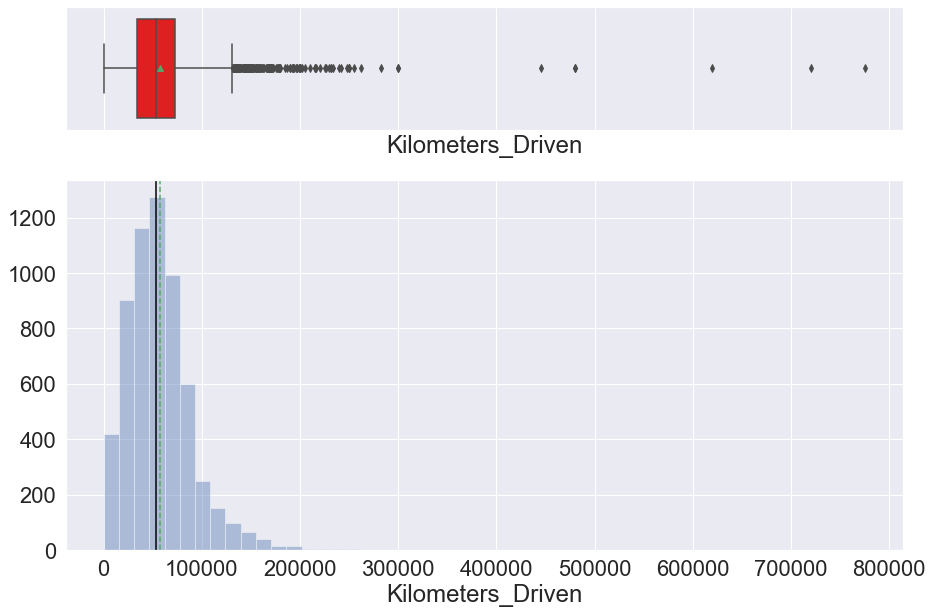

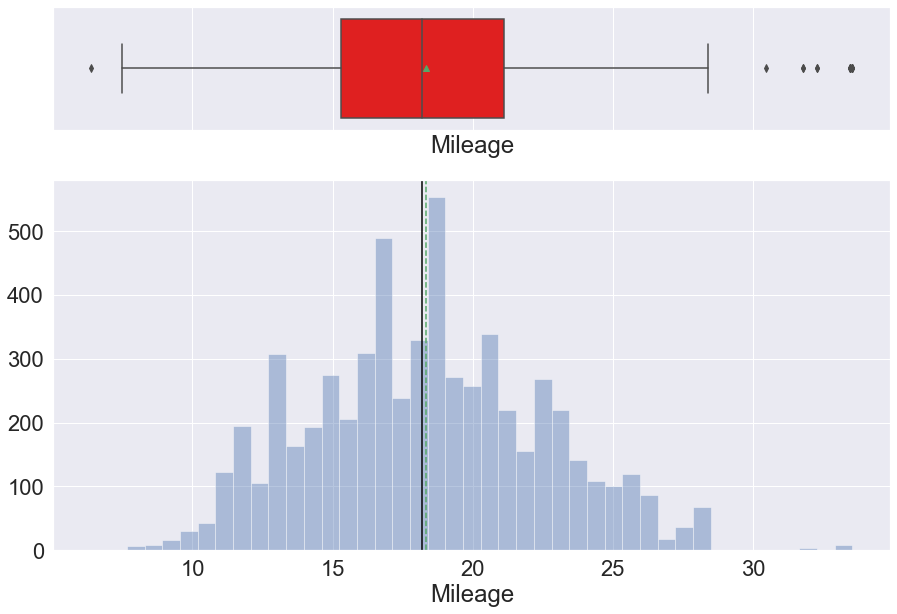

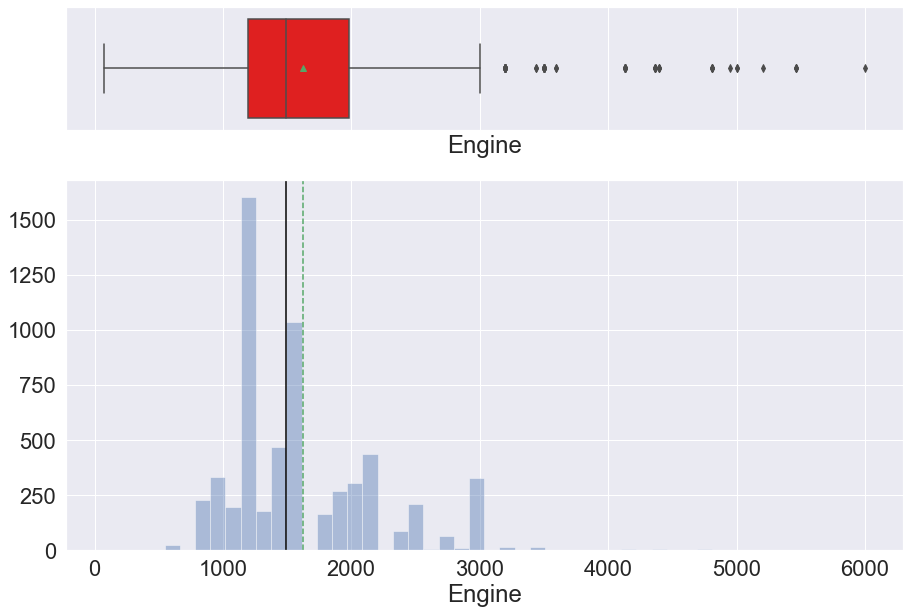

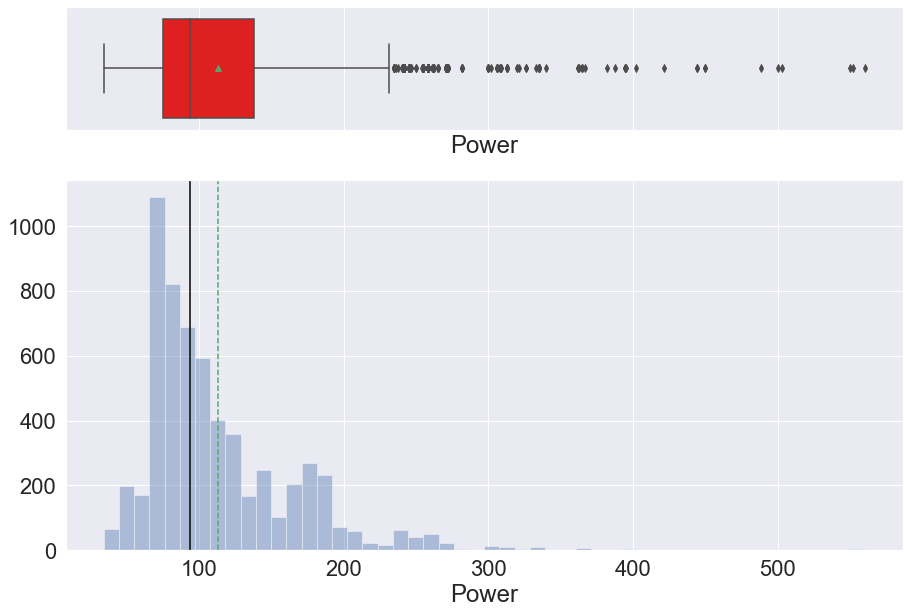

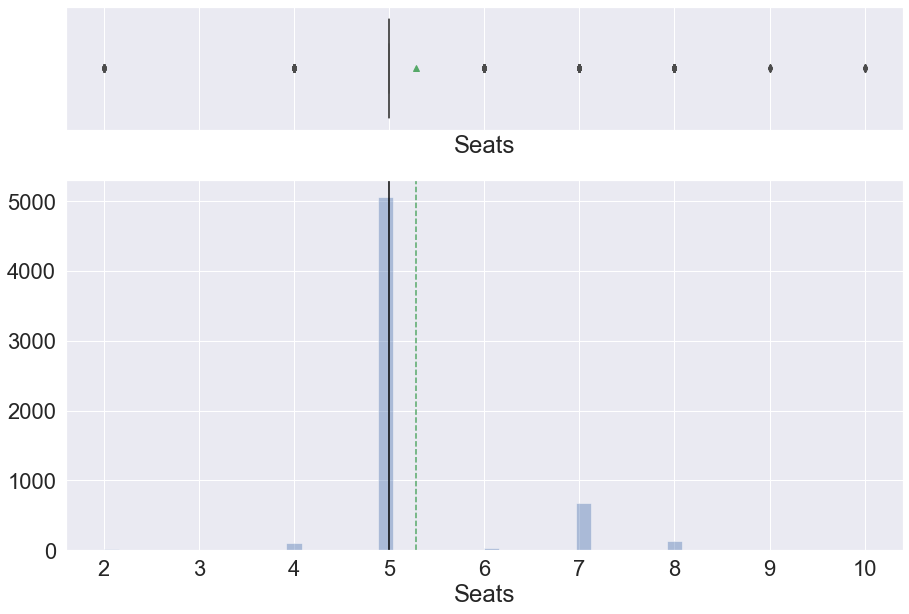

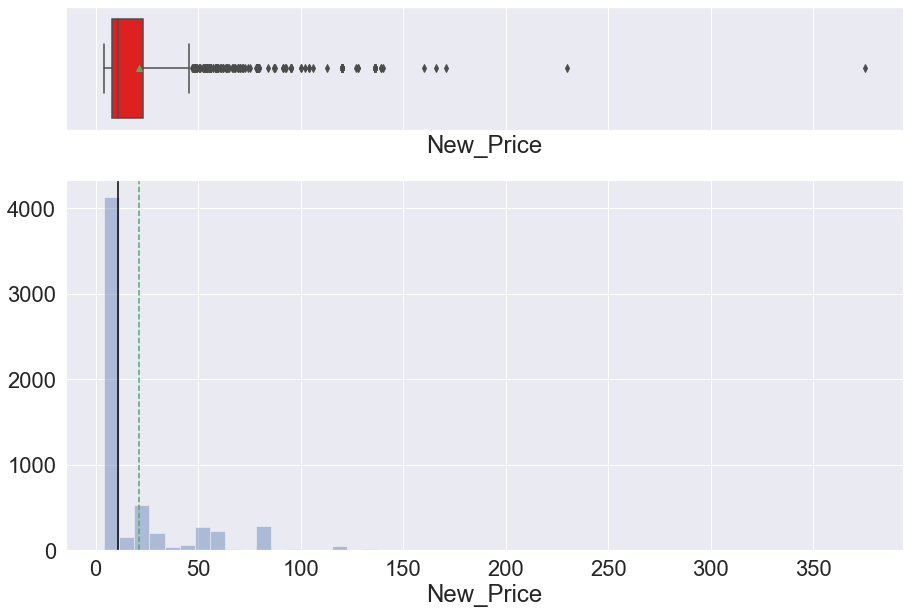

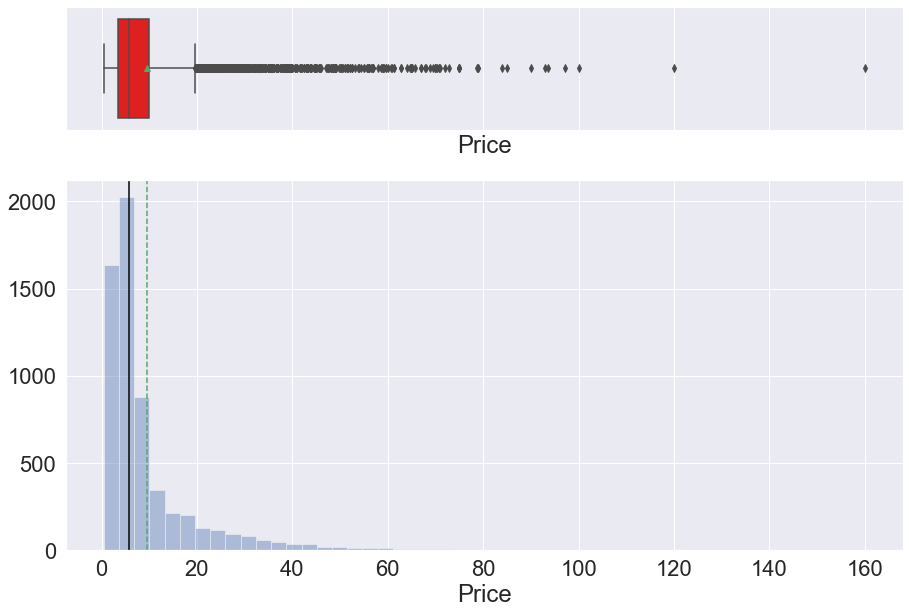

In [44]:
#Outlier and distribution using boxplots and histograms for columns that have numbers
numeric_columns = data.select_dtypes(include=np.number).columns.tolist()
numeric_columns.remove('Year') #Not significant for this

for col in numeric_columns:
    x = col
    histogram_boxplot(data[x])

*From these, we can see that the Price, Kilometers drive, and Power have the most outliers present. The Skewness of Price, New_Price, and Kilometers driven is going to be needing some transformation done to help with the distribution.*

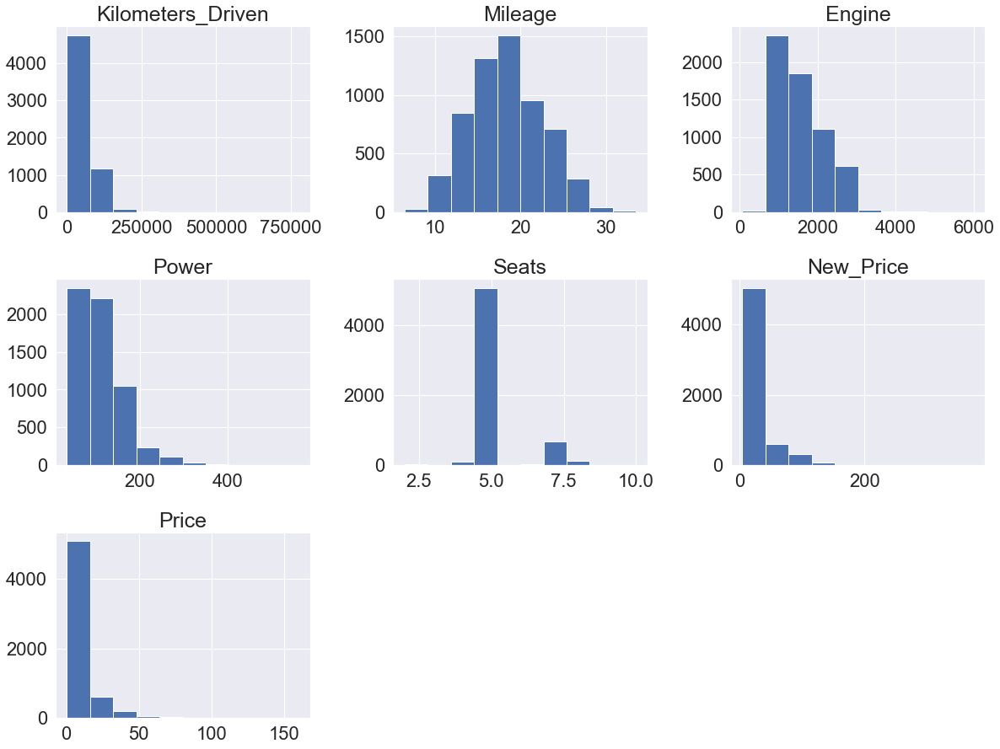

In [45]:
#Focusing on looking at the distrbution only
plt.figure(figsize=(17,75))

for i in range(len(numeric_columns)):
    plt.subplot(18,3,i+1)
    plt.hist(data[numeric_columns[i]])
    #sns.displot(df[all_col[i]], kde=True)
    plt.tight_layout()
    plt.title(numeric_columns[i],fontsize=25)
    

plt.show()

*'New_Price', 'Kilometers_Driven', and 'Price' all seem to be very skewed. These 3 would be most benefited from doing a log transformation or something similar to that. Let's take a closer look.*

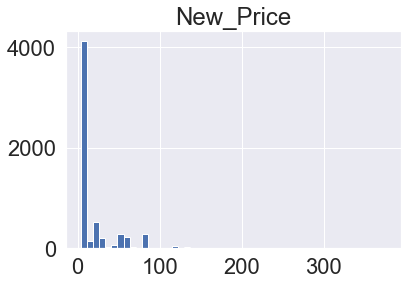

0


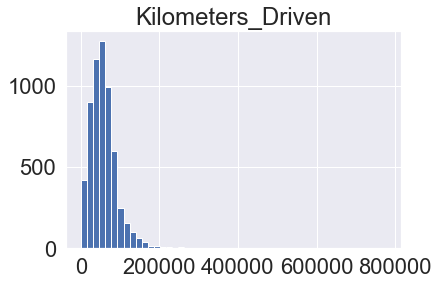

0


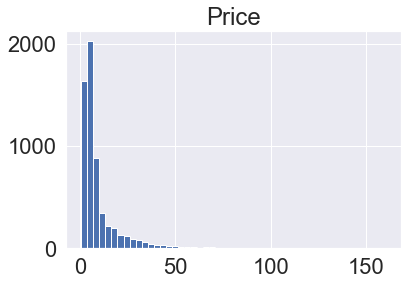

0


In [46]:
cols_to_log = ['New_Price', 'Kilometers_Driven', 'Price'] #Printing the 3 distributions
for colname in cols_to_log:
    plt.hist(data[colname], bins=50)
    plt.title(colname)
    plt.show()
    print(np.sum(data[colname] <= 0))

**To fix the distribution issue we are seeing here, there are three different approaches I'm going to attempt. A log transformation, archsinh transformation, and a square root transformation. From there, we'll be able to better determine which of these transformations we want to keep.*


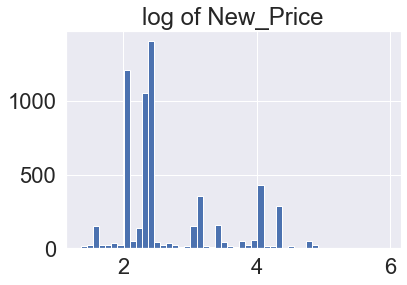

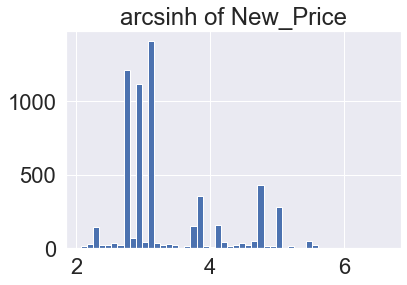

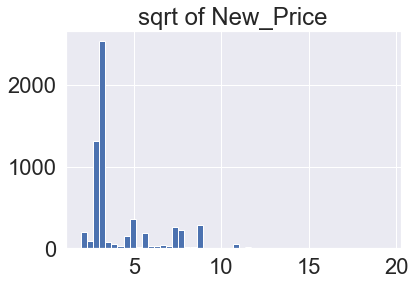

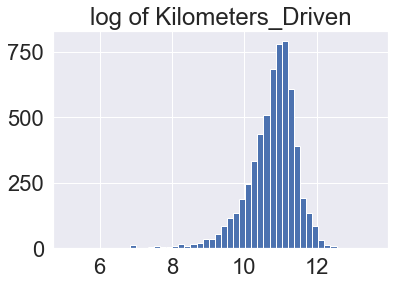

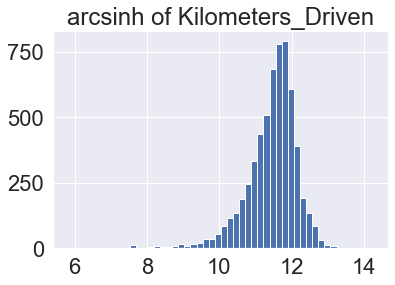

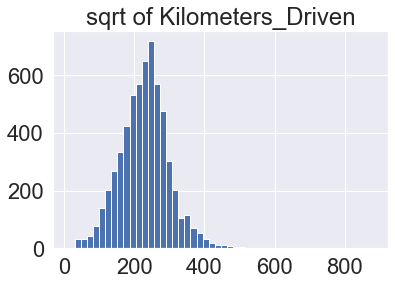

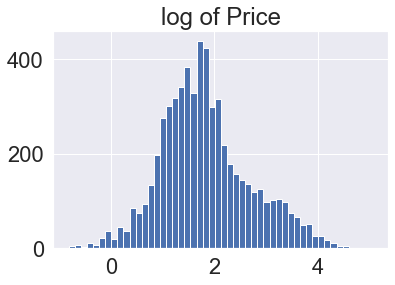

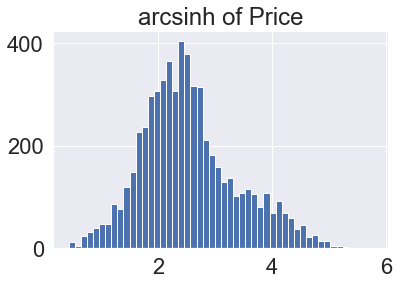

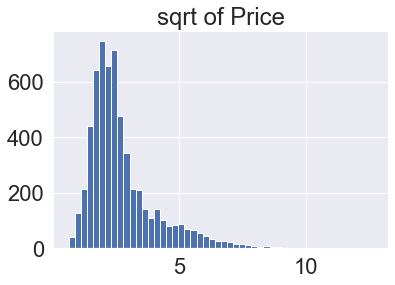

In [47]:
#Applying three different transformations to each of the graphs. From there, we'll be able to better determine which of these transformations we want to keep.
for colname in cols_to_log:
    plt.hist(np.log(data[colname]), 50)
    plt.title('log of ' + colname )
    plt.show()
    plt.hist(np.arcsinh(data[colname]), 50)
    plt.title('arcsinh of ' + colname )
    plt.show()
    plt.hist(np.sqrt(data[colname]), 50)
    plt.title('sqrt of ' + colname )
    plt.show()

*The log transformation for each of these looks to be the best transformation to apply.*

In [48]:
# Using this formula to add the log transformation data to the dataframe and removing the old columns.
for colname in cols_to_log:
    data[colname + '_log'] = np.log(data[colname] + 1)
data.drop(cols_to_log, axis=1, inplace=True)

In [49]:
data.head()

,Brand,Model,Location,Year,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price_log,Kilometers_Driven_log,Price_log
0,Maruti,Wagon,Mumbai,2010,CNG,Manual,First,26.60,998.0,58.16,5.0,2.182675,11.184435,1.011601
1,Hyundai,Creta,Pune,2015,Diesel,Manual,First,19.67,1582.0,126.20,5.0,2.373975,10.621352,2.602690
2,Honda,Jazz,Chennai,2011,Petrol,Manual,First,18.20,1199.0,88.70,5.0,2.262804,10.736418,1.704748
3,Maruti,Ertiga,Chennai,2012,Diesel,Manual,First,20.77,1248.0,88.76,7.0,2.182675,11.373675,1.945910
4,Audi,A4,Coimbatore,2013,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,4.036186,10.613271,2.930660


In [50]:
data.columns

Index(['Brand', 'Model', 'Location', 'Year', 'Fuel_Type', 'Transmission',
       'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats', 'New_Price_log',
       'Kilometers_Driven_log', 'Price_log'],
      dtype='object')

In [51]:
#pandas_profiling.ProfileReport(data).to_file("Cars4YouProfiling.html") #Pandas profiling done to get an overview of the data

# Data Analysis using Visulizations

Text(0.5, 1.0, 'Most frequent Company')

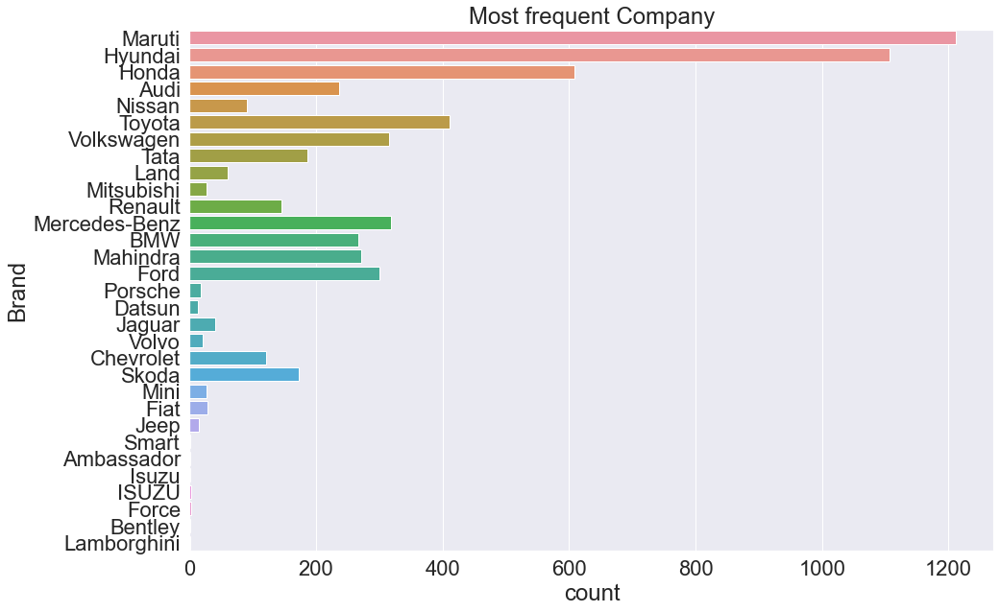

In [52]:
plt.figure(figsize = [15,10])
sns.countplot(y =  'Brand',data = data)
plt.title("Most frequent Company")

*From here, we can see that the brands of the cars are significantly skewed because of being associated with a lot of models & cars in this dataset! This may be a feature we need to take out.*

## Correlations with respect to Price

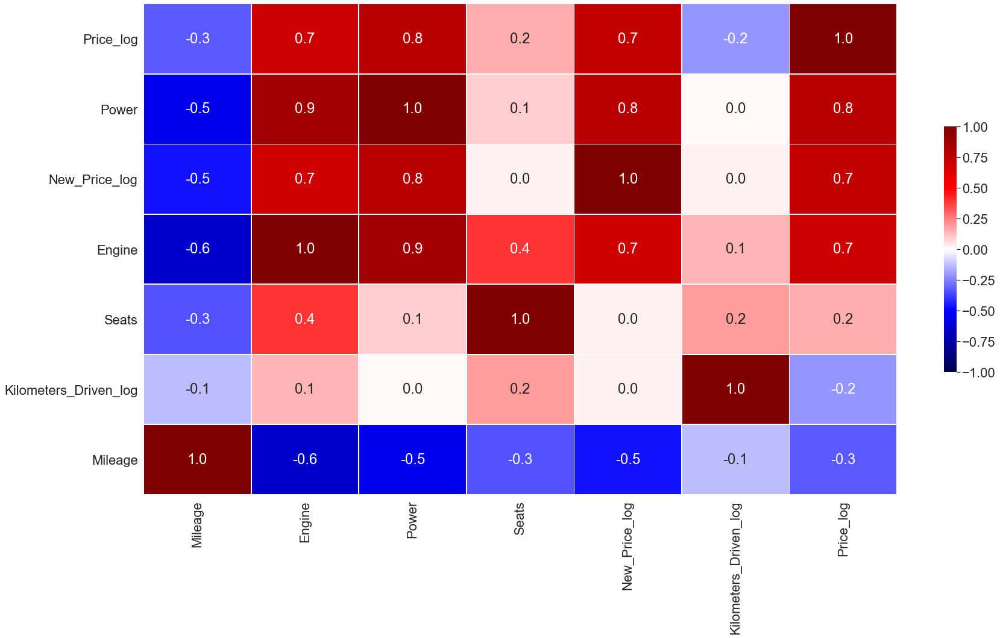

In [53]:
numeric_columns = data.select_dtypes(include=np.number).columns.tolist()
numeric_columns.remove('Year') # dropping year column as it is temporal variable

corr = data[numeric_columns].corr().sort_values(by=['Price_log'],ascending=False) 

f, ax = plt.subplots(figsize=(28, 15))

sns.heatmap(corr, 
            cmap='seismic', annot=True,fmt=".1f",vmin=-1, vmax=1, center= 0,
            square=False, linewidths=.7, cbar_kws={"shrink": .5});

- *From this correlation chart, we can understand that Price is negatively affected as the Mileage of a car icnreases.*

- *The strongest positively correlated are the Engine, Power, and the New_Price. The New_Price may be deleted as a feature down the road as 86% of the data was imputed based on only 14% due to missing data.*

## Using the categorical variables and these correlations to gain more insight



<AxesSubplot:xlabel='Fuel_Type', ylabel='Price_log'>

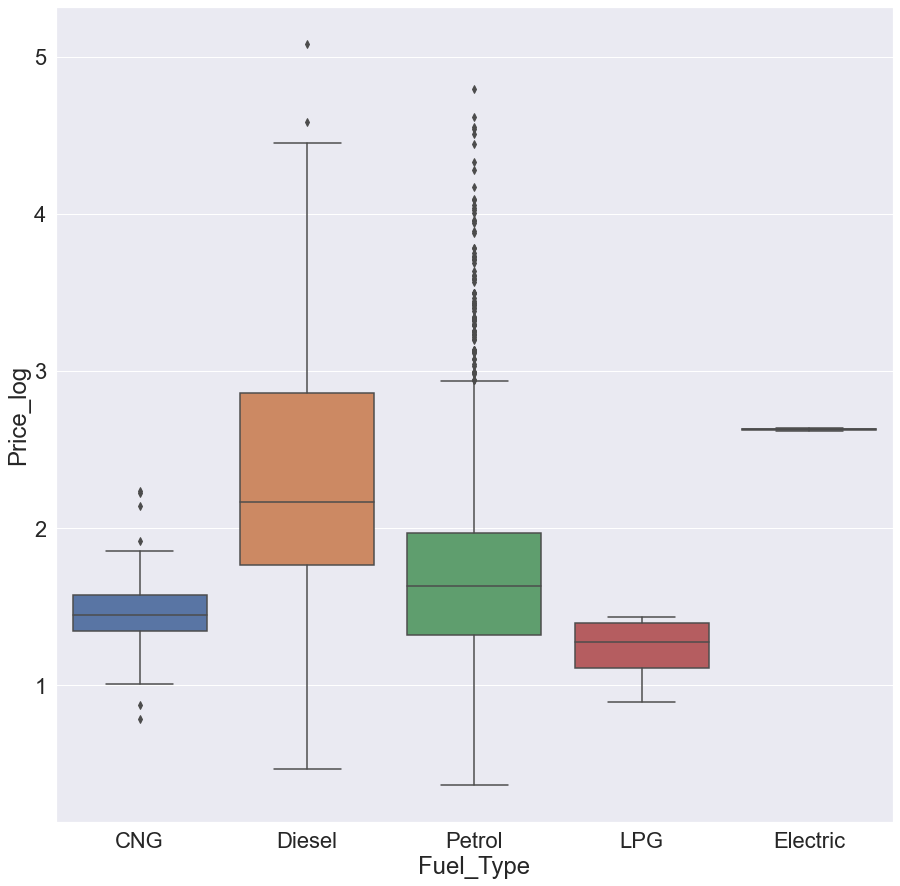

In [54]:
plt.figure(figsize = [15,15])
sns.boxplot(x='Fuel_Type', y="Price_log", data=data)


*The price of cars based on the type of fuel being used shows a great amount of distribution and outliers within Petrol! The price is significantly affected here due the Petrol, with Diesel right behind.*

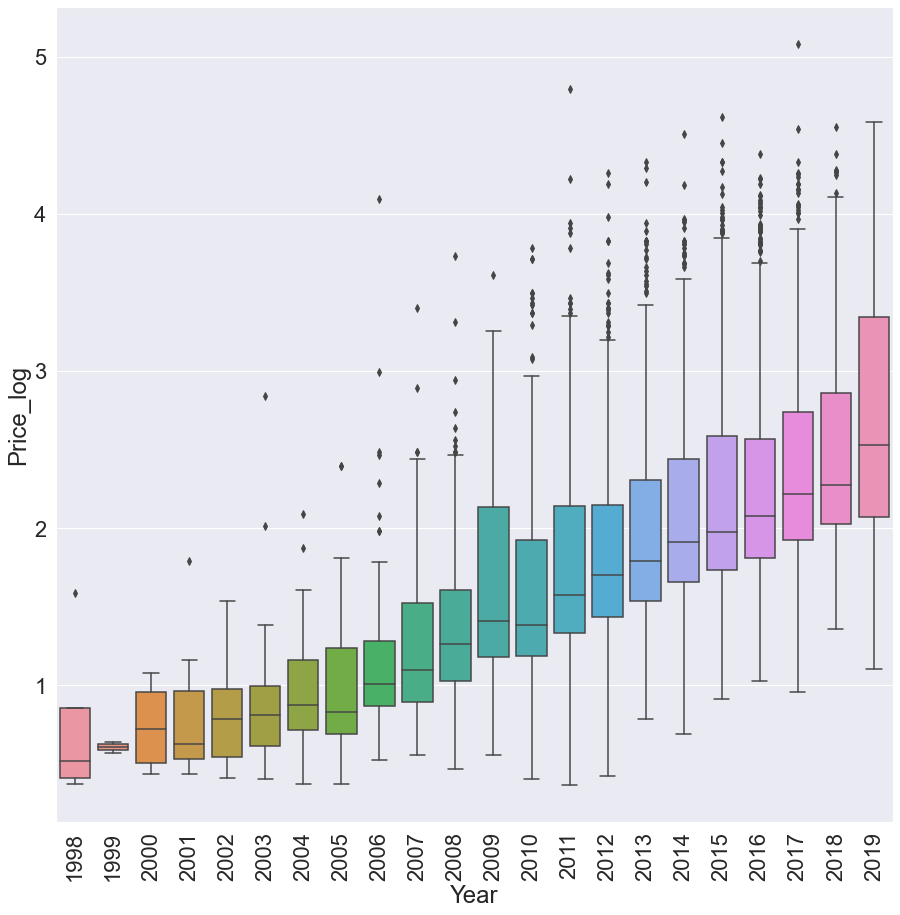

In [55]:
plt.figure(figsize = [15,15])

sns.boxplot(x='Year', y="Price_log", data=data)
plt.xticks(rotation=90);

*As expected, there has been a steady increase in the price of the vehicle as the years have gone by up until 2010. Afterwards, we see a steeper increase in prices with many more outliers- showing the average price hasn't even got close to catching up with the max!*

<AxesSubplot:xlabel='Owner_Type', ylabel='Price_log'>

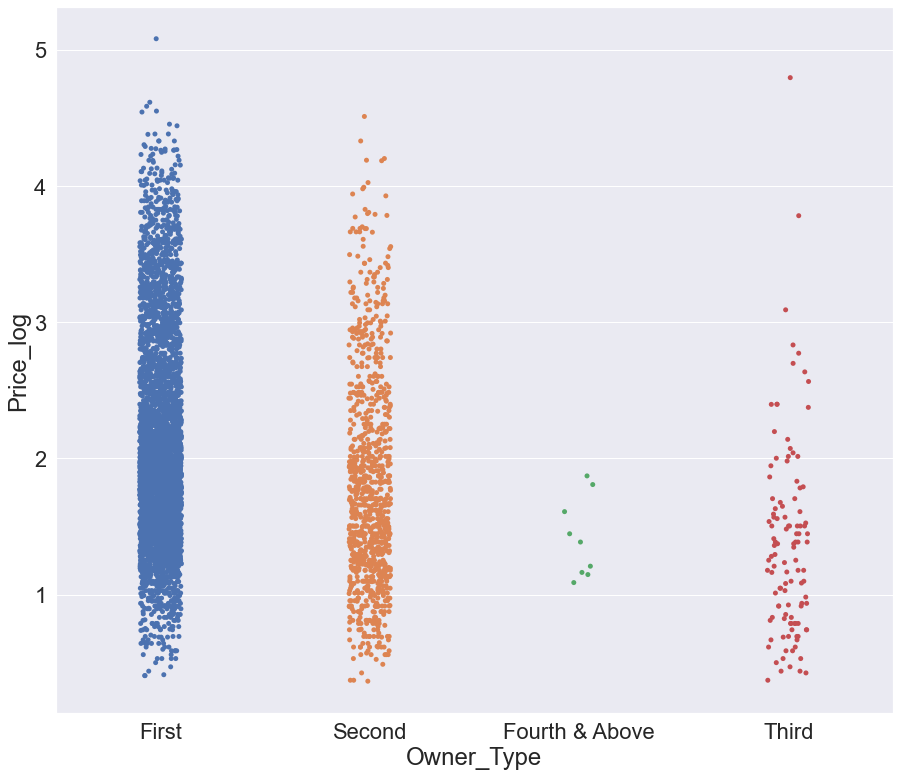

In [56]:
plt.figure(figsize=(15,13))
sns.stripplot(x = 'Owner_Type', y ='Price_log', data = data) 

*The sale of vehicles after 4 or more owners significantly decreases, with a very low value! You are most likely to sell your car as a First owner for the best price. There is one outlier as the third owner of a vehicle was able to sell his vehicle for a very high price!* 

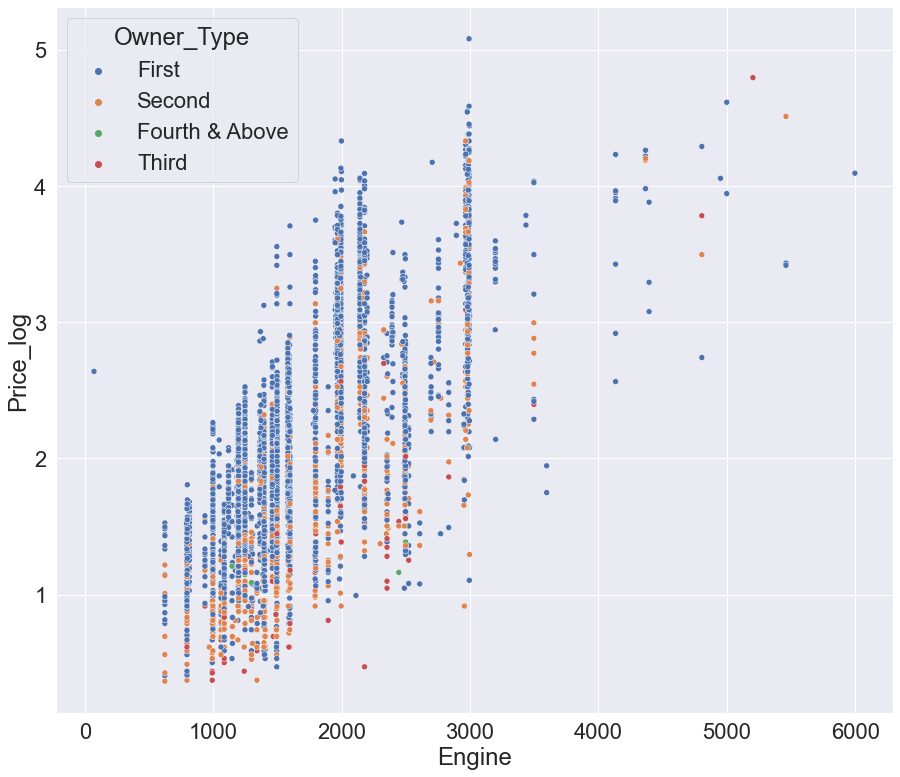

In [57]:
plt.figure(figsize=(15,13))
sns.scatterplot(y='Price_log', x='Engine', hue='Owner_Type', data=data);

*As the power of the vehicle goes up, the price of the car also goes up. First owners of cars usully have better price value, but there is no proper distribution when grouped by on Owner_type*

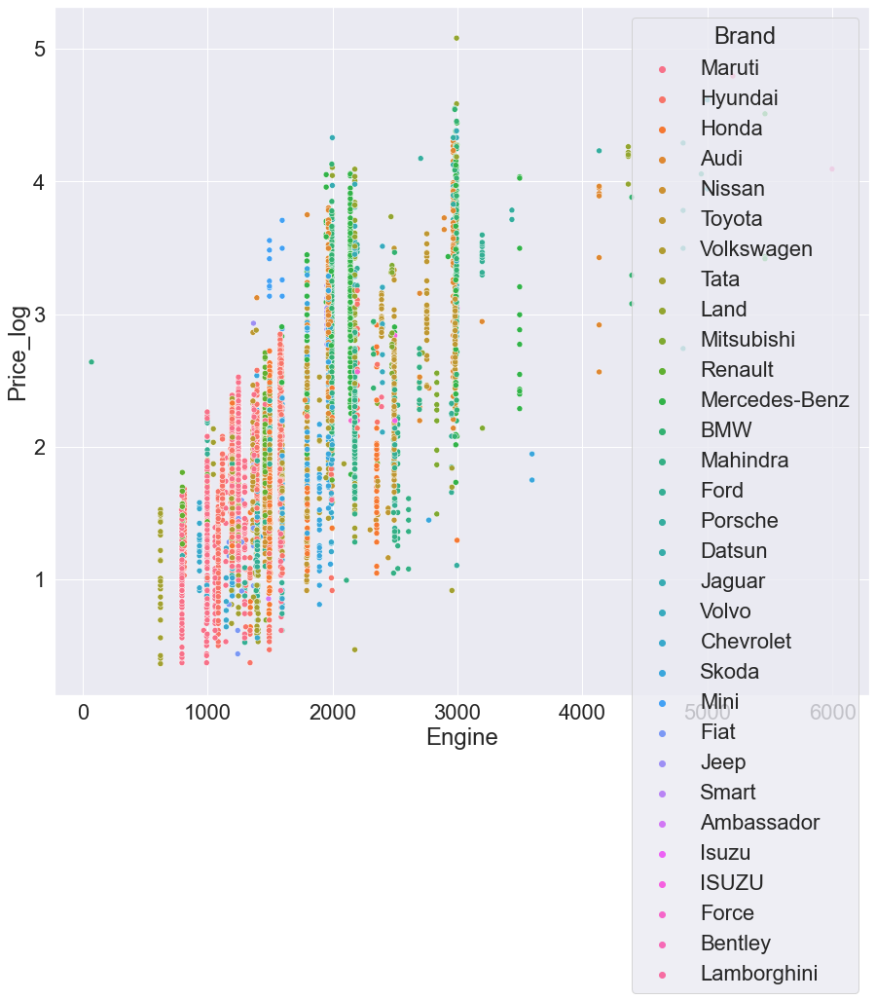

In [58]:
plt.figure(figsize=(15,13))
sns.scatterplot(y='Price_log', x='Engine', hue='Brand', data=data);

*Brand Maruti tends to have the weakest engines as well as the lowest price points of their vehicles! The more powerful, more expensive vehicles belong to Porsche, Lamborghini, and other sport brands!

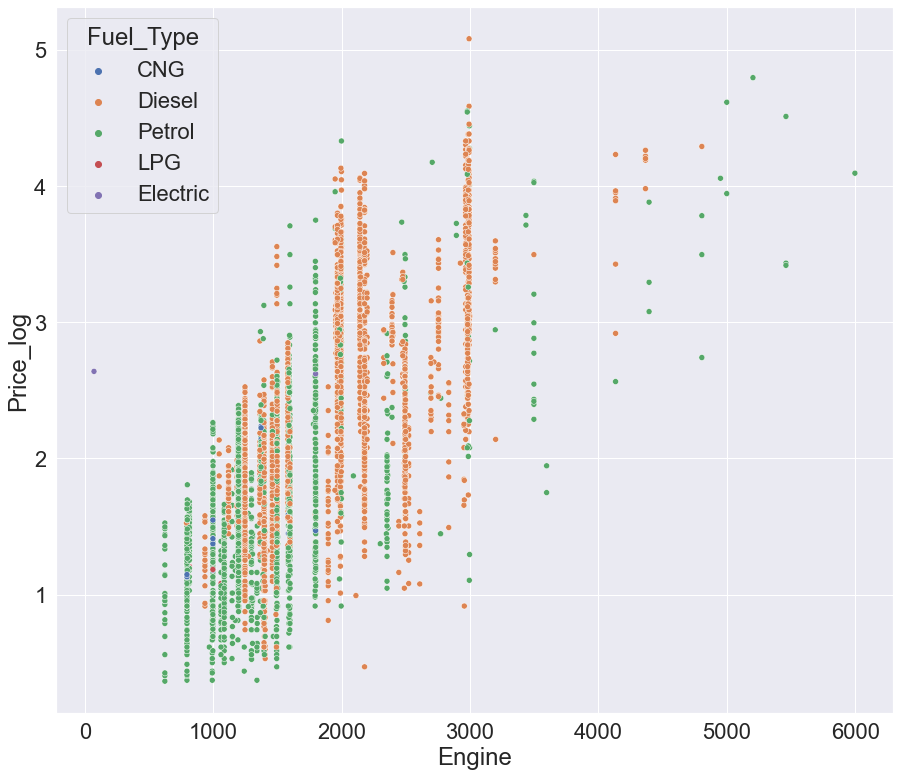

In [59]:
plt.figure(figsize=(15,13))
sns.scatterplot(y='Price_log', x='Engine', hue='Fuel_Type', data=data);

*Petrol vehicles have the strongest strong engines in this dataset, but most of the Petrol vehicles are on the lowest end of engine output. The Diesel fuel type has a lot of values in the 2000-3000 range for engine output* 

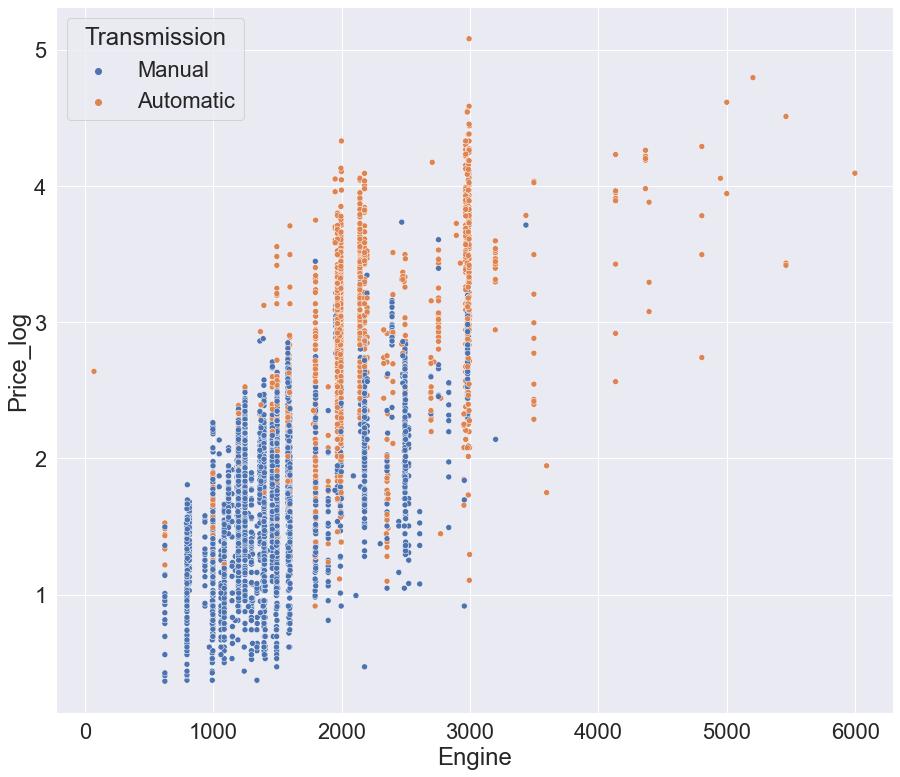

In [60]:
plt.figure(figsize=(15,13))
sns.scatterplot(y='Price_log', x='Engine', hue='Transmission', data=data);

*Automatic cars tend to more expensive, and only automatic cars have engine outputs of over 3500! Manual cars are on the lower end of the value scale*

*We have seen a lot of relationships on the Univariate and Bivariate graphs. It's almost time to start with the model!*

# Outliers Treatment!

**I chose to treat the outliers by flooring and capping the outter quartile ranges*

In [61]:
def treat_outliers(data,col):
    '''
    treats outliers in a varaible
    col: str, name of the numerical varaible
    df: data frame
    col: name of the column
    '''
    Q1=data[col].quantile(0.25) # 25th quantile
    Q3=data[col].quantile(0.75)  # 75th quantile
    IQR=Q3-Q1
    Lower_Whisker = Q1 - 1.5*IQR 
    Upper_Whisker = Q3 + 1.5*IQR
    data[col] = np.clip(data[col], Lower_Whisker, Upper_Whisker) # all the values samller than Lower_Whisker will be assigned value of Lower_whisker 
                                                            # and all the values above upper_whishker will be assigned value of upper_Whisker 
    return data

def treat_outliers_all(data, col_list):
    '''
    treat outlier in all numerical varaibles
    col_list: list of numerical varaibles
    df: data frame
    '''
    for c in col_list:
        data = treat_outliers(data,c)
        
    return data
    

In [62]:
numerical_col = data.select_dtypes(include=np.number).columns.tolist()
data = treat_outliers_all(data,numerical_col)

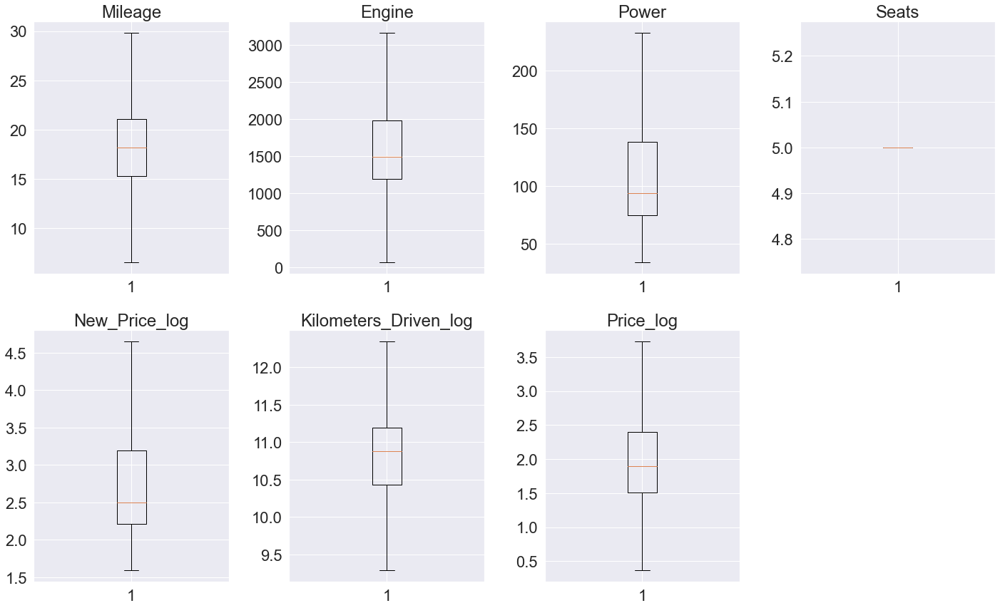

In [63]:
#Let's confirm the outliers have been taken care of.
plt.figure(figsize=(20,30))

for i, variable in enumerate(numeric_columns):
                     plt.subplot(5,4,i+1)
                     plt.boxplot(data[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

# Model Building

We are going to drop Model and New Price from the modeling set. The car model is addressed and taken into account with the Brand.

With New Price of the car, the data had 86% of missing values. Even with imputations, this results in much of data being fabricated based on only 14% of the total rows of data. This is widely inaccurate and would cause improper predictions. 

In [64]:
data.head()
modeldata = data #a new dataframe to work with

#modeldata['Price'] = np.exp(modeldata['Price_log'])
#modeldata['Kilometers_Driven'] = np.exp(modeldata['Kilometers_Driven_log'])
#modeldata = modeldata.drop(['Price_log'],axis=1)
#modeldata = modeldata.drop(['Kilometers_Driven_log'],axis=1)

In [65]:
#Defining X and y variables for our model
X = modeldata.drop(['Price_log', 'Model', 'New_Price_log'], axis=1) #Dropping dependent variable and columns we won't be using
y = modeldata[['Price_log']] #The value we are trying to predict!

display(X.head())
display(y.head())

,Brand,Location,Year,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,Kilometers_Driven_log
0,Maruti,Mumbai,2010.0,CNG,Manual,First,26.60,998.0,58.16,5.0,11.184435
1,Hyundai,Pune,2015.0,Diesel,Manual,First,19.67,1582.0,126.20,5.0,10.621352
2,Honda,Chennai,2011.0,Petrol,Manual,First,18.20,1199.0,88.70,5.0,10.736418
3,Maruti,Chennai,2012.0,Diesel,Manual,First,20.77,1248.0,88.76,5.0,11.373675
4,Audi,Coimbatore,2013.0,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,10.613271


,Price_log
0,1.011601
1,2.602690
2,1.704748
3,1.945910
4,2.930660


## Dummy Encoding

** We need to take care of the categorical values so that they can contribute to the model efficiently. I am using the dummy encoding approach to do this**

In [66]:
X = pd.get_dummies(X, columns=['Brand', 'Location', 'Fuel_Type', 'Transmission', 'Owner_Type'], drop_first=True) #dropping the first column of the dummy variable because it's determinable if all others are 0
X.head()

,Year,Mileage,Engine,Power,Seats,Kilometers_Driven_log,Brand_Audi,Brand_BMW,Brand_Bentley,Brand_Chevrolet,Brand_Datsun,Brand_Fiat,Brand_Force,Brand_Ford,Brand_Honda,Brand_Hyundai,Brand_ISUZU,Brand_Isuzu,Brand_Jaguar,Brand_Jeep,Brand_Lamborghini,Brand_Land,Brand_Mahindra,Brand_Maruti,Brand_Mercedes-Benz,Brand_Mini,Brand_Mitsubishi,Brand_Nissan,Brand_Porsche,Brand_Renault,Brand_Skoda,Brand_Smart,Brand_Tata,Brand_Toyota,Brand_Volkswagen,Brand_Volvo,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Fuel_Type_Diesel,Fuel_Type_Electric,Fuel_Type_LPG,Fuel_Type_Petrol,Transmission_Manual,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third
0,2010.0,26.60,998.0,58.16,5.0,11.184435,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
1,2015.0,19.67,1582.0,126.20,5.0,10.621352,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0
2,2011.0,18.20,1199.0,88.70,5.0,10.736418,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
3,2012.0,20.77,1248.0,88.76,5.0,11.373675,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
4,2013.0,15.20,1968.0,140.80,5.0,10.613271,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0


## Splitting the data for training/testing at 70/30! 


In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=82) #splitting the data into test and train

# Training and Evaluating the Lienar Regression Model for Price

In [68]:
#Fitting linear model
lin_reg_model = LinearRegression()                                    
lin_reg_model.fit(X_train, y_train)  

LinearRegression()

In [69]:
# let us check the coefficients and intercept of the model
pd.set_option('display.float_format', lambda x: '%.3f' % x)
coef_df = pd.DataFrame(np.append(lin_reg_model.coef_.flatten(), lin_reg_model.intercept_), \
                       index=X_train.columns.tolist()+['Intercept'], columns=['Coefficients'])
print(coef_df)

                           Coefficients
Year                              0.095
Mileage                          -0.013
Engine                            0.000
Power                             0.005
Seats                            -0.000
Kilometers_Driven_log            -0.076
Brand_Audi                        0.208
Brand_BMW                         0.166
Brand_Bentley                     1.140
Brand_Chevrolet                  -0.501
Brand_Datsun                     -0.576
Brand_Fiat                       -0.447
Brand_Force                      -0.179
Brand_Ford                       -0.299
Brand_Honda                      -0.257
Brand_Hyundai                    -0.265
Brand_ISUZU                      -0.613
Brand_Isuzu                      -0.320
Brand_Jaguar                      0.262
Brand_Jeep                       -0.133
Brand_Lamborghini                 0.000
Brand_Land                        0.426
Brand_Mahindra                   -0.370
Brand_Maruti                     -0.219


*From the correlations, we can see that having a Bently will increase your price value the most! The coefficient seen as the Datsun brand is the lowest, meaning this will hurt your car value price the most*

In [70]:
# Defining the functions so that we can check our model performance!
# MAPE
def mape(targets, predictions):
    return np.mean(np.abs((targets - predictions)) / targets) * 100

# Adjusted R^2
def adj_r2(ind_vars, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = ind_vars.shape[0]
    k = ind_vars.shape[1]
    return 1-((1-r2)*(n-1)/(n-k-1))

# Model performance check
def model_perf(model, inp, out):

    y_pred = model.predict(inp)
    y_act = out.values

    return pd.DataFrame({
                "RMSE": np.sqrt(mean_squared_error(y_act, y_pred)),
                "MAE": mean_absolute_error(y_act, y_pred),
                "MAPE": mape(y_act, y_pred),
                "R^2": r2_score(y_act, y_pred),
                "Adjusted R^2": adj_r2(inp, y_act, y_pred)
           }, index=[0])

In [71]:
# Checking model performance on train set
print('Training Performance\n')
print(model_perf(lin_reg_model, X_train, y_train))

Training Performance

   RMSE   MAE  MAPE   R^2  Adjusted R^2
0 0.189 0.142 8.084 0.932         0.931


The mean absolute error (MAE) is the simplest regression error metric to understand. We'll calculate the residual for every data point, taking only the absolute value of each so that negative and positive residuals do not cancel out. We then take the average of all these residuals. Effectively, MAE describes the typical magnitude of the residuals.

In [72]:
# Checking model performance on test set
print('Test Performance\n')
print(model_perf(lin_reg_model, X_test, y_test))

Test Performance

   RMSE   MAE  MAPE   R^2  Adjusted R^2
0 0.189 0.145 8.153 0.934         0.932


-The RMSE is low on both sets, and shows very little change between the test/train scores. This drives show that this model is a good fit with comparable RMSE values.

-With a low MAE value, we can understand the typical magnitude of the residuals is very low, meaning the variability is low. 

-With an R^2 showing about 95.5%, the model shows decent performance overall The train and test data is very close as well.

-We need to check the linear regression assumptions and confirm we followed the rules. The most important part!

# Checking the Linear Regression Assumptions
1. **No Multicollinearity**
2. **Mean of residuals should be 0**
3. **No Heteroscedacity**
4. **Linearity of variables**
5. **Normality of error terms**

### 1 - No multicollinearity - Checking the VIF scores of each before feature selection. Must be below a threshold of 5.0!

In [73]:
#Using a new dataframe to work in
X1 = X.copy()
X1['const'] = 1
X1.head()

,Year,Mileage,Engine,Power,Seats,Kilometers_Driven_log,Brand_Audi,Brand_BMW,Brand_Bentley,Brand_Chevrolet,Brand_Datsun,Brand_Fiat,Brand_Force,Brand_Ford,Brand_Honda,Brand_Hyundai,Brand_ISUZU,Brand_Isuzu,Brand_Jaguar,Brand_Jeep,Brand_Lamborghini,Brand_Land,Brand_Mahindra,Brand_Maruti,Brand_Mercedes-Benz,Brand_Mini,Brand_Mitsubishi,Brand_Nissan,Brand_Porsche,Brand_Renault,Brand_Skoda,Brand_Smart,Brand_Tata,Brand_Toyota,Brand_Volkswagen,Brand_Volvo,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Fuel_Type_Diesel,Fuel_Type_Electric,Fuel_Type_LPG,Fuel_Type_Petrol,Transmission_Manual,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third,const
0,2010.000,26.600,998.000,58.160,5.000,11.184,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
1,2015.000,19.670,1582.000,126.200,5.000,10.621,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1
2,2011.000,18.200,1199.000,88.700,5.000,10.736,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1
3,2012.000,20.770,1248.000,88.760,5.000,11.374,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1
4,2013.000,15.200,1968.000,140.800,5.000,10.613,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1


In [74]:
#VIF score check

vif_series1 = pd.Series([variance_inflation_factor(X1.values,i) for i in range(X1.shape[1])],index=X1.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series1))

Series before feature selection: 

Year                          2.227
Mileage                       3.817
Engine                        9.473
Power                         8.805
Seats                         0.000
Kilometers_Driven_log         1.932
Brand_Audi                  232.132
Brand_BMW                   260.698
Brand_Bentley                 2.028
Brand_Chevrolet             121.165
Brand_Datsun                 14.185
Brand_Fiat                   29.256
Brand_Force                   4.046
Brand_Ford                  289.816
Brand_Honda                 556.485
Brand_Hyundai               918.102
Brand_ISUZU                   3.032
Brand_Isuzu                   2.022
Brand_Jaguar                 41.592
Brand_Jeep                   16.257
Brand_Lamborghini             2.018
Brand_Land                   61.468
Brand_Mahindra              264.209
Brand_Maruti                982.874
Brand_Mercedes-Benz         307.950
Brand_Mini                   27.377
Brand_Mitsubishi             

*With many scores above the common threshold of 5, we need to dive deeper into getting this fixed.*

*Almost all of the Brands have an extremely high amount of colinearity. Removing the brand with the highest colinearity from the dataset would be the best approach in this case. Brand_Maruti will be removed VIF scores reevaluated.*


In [75]:
unwanted = X1.columns[X1.columns.str.startswith('Brand_M')]
X1.drop(unwanted, axis=1, inplace=True) #dropping the Brand_Maruti column

In [76]:
#VIF scores after removing Brand Maruti
vif_series1 = pd.Series([variance_inflation_factor(X1.values,i) for i in range(X1.shape[1])],index=X1.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series1))

Series before feature selection: 

Year                         2.168
Mileage                      3.559
Engine                       8.955
Power                        7.455
Seats                        0.000
Kilometers_Driven_log        1.902
Brand_Audi                   1.381
Brand_BMW                    1.554
Brand_Bentley                1.007
Brand_Chevrolet              1.066
Brand_Datsun                 1.018
Brand_Fiat                   1.023
Brand_Force                  1.006
Brand_Ford                   1.139
Brand_Honda                  1.305
Brand_Hyundai                1.395
Brand_ISUZU                  1.008
Brand_Isuzu                  1.006
Brand_Jaguar                 1.090
Brand_Jeep                   1.038
Brand_Lamborghini            1.017
Brand_Land                   1.102
Brand_Nissan                 1.045
Brand_Porsche                1.065
Brand_Renault                1.074
Brand_Skoda                  1.096
Brand_Smart                  1.008
Brand_Tata          

*Dropping the Brand Maruti column helps tremendously. Now we need to focus on Fuel_Type_Diesel, as well as Engine & Power.

In [77]:
# Method to drop all the multicollinear columns and choose which one we should drop
def treating_multicollinearity(high_vif_columns, x_train, x_test, y_train, y_test):
    """
    Drop every column that has VIF score greater than 5, one by one.
    Look at the adjusted R square of all these models
    Look at the RMSE of all these models on test data
    """
    adj_rsq_scores = []
    rmse_test_data = []

    # build ols models by dropping one of these at a time and observe the Adjusted R-squared
    for cols in high_vif_columns:
        train = x_train.loc[:, ~x_train.columns.str.startswith(cols)]
        test = x_test.loc[:, ~x_test.columns.str.startswith(cols)]
        # Create the model
        
        model = LinearRegression(fit_intercept=False)
        model.fit(train, y_train)
        # Adj R-Sq
        adj_rsq_scores.append(adj_r2(train, y_train, model.predict(train)))
        # RMSE (Test data)
        y_pred_test_Price = model.predict(test)
        y_test_Price = y_test
        rmse_test_data.append(np.sqrt(mean_squared_error(y_pred_test_Price, y_test_Price)))

    # Add new Adj_Rsq and RMSE after dropping each colmn
    temp = pd.DataFrame(
        {
            "col": high_vif_columns,
            "Adj_rsq_after_dropping_col": adj_rsq_scores,
            "Test RMSE": rmse_test_data,
        }
    ).sort_values(by="Adj_rsq_after_dropping_col", ascending=False)

    print(temp)

In [78]:
high_vif_columns = ["Fuel_Type_Diesel", "Fuel_Type_Petrol",'Engine','Power']

X_train1 = X_train.copy()
X_train1['constant'] = 1
unwanted = X_train1.columns[X_train1.columns.str.startswith('Brand_M')]
X_train1.drop(unwanted, axis=1, inplace=True)

X_test1 = X_test.copy()
X_test1['constant'] = 1
unwanted = X_test1.columns[X_test1.columns.str.startswith('Brand_M')]
X_test1.drop(unwanted, axis=1, inplace=True)


treating_multicollinearity(high_vif_columns, X_train1, X_test1, y_train, y_test)

                col  Adj_rsq_after_dropping_col  Test RMSE
1  Fuel_Type_Petrol                       0.915      0.211
0  Fuel_Type_Diesel                       0.915      0.212
2            Engine                       0.914      0.211
3             Power                       0.885      0.252


*Dropping the Fuel_Type_Petrol would be the best option here as it affects the rmse the least.*

In [79]:
#Dropping fuel type Petrol and rechecking the VIF!
X_train2 = X_train1.drop( "Fuel_Type_Petrol", axis=1)
X_test2 = X_test1.drop( "Fuel_Type_Petrol", axis=1)


vif_series2 = pd.Series([variance_inflation_factor(X_train2.values,i) for i in range(X_train2.shape[1])],index=X_train2.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series2))

Series before feature selection: 

Year                        2.177
Mileage                     3.445
Engine                      9.180
Power                       7.967
Seats                       0.000
Kilometers_Driven_log       1.906
Brand_Audi                  1.384
Brand_BMW                   1.583
Brand_Bentley               1.011
Brand_Chevrolet             1.061
Brand_Datsun                1.020
Brand_Fiat                  1.020
Brand_Force                 1.009
Brand_Ford                  1.141
Brand_Honda                 1.288
Brand_Hyundai               1.380
Brand_ISUZU                 1.011
Brand_Isuzu                 1.009
Brand_Jaguar                1.106
Brand_Jeep                  1.047
Brand_Lamborghini             nan
Brand_Land                  1.101
Brand_Nissan                1.042
Brand_Porsche               1.064
Brand_Renault               1.067
Brand_Skoda                 1.087
Brand_Smart                 1.012
Brand_Tata                  1.098
Brand_Toyota 

*Engine and power are the only ones that need to be treated*

In [80]:
high_vif_columns = ["Engine", "Power"]

treating_multicollinearity(high_vif_columns, X_train2, X_test2, y_train, y_test)

      col  Adj_rsq_after_dropping_col  Test RMSE
0  Engine                       0.914      0.211
1   Power                       0.886      0.252


*Dropping the Engine would be the best approach as it affects the predictability in the best way.*

In [81]:
#Dropping Engine column and rechecking VIF!
X_train3 = X_train2.drop( "Engine", axis=1)
X_test3 = X_test2.drop( "Engine", axis=1)


vif_series3 = pd.Series([variance_inflation_factor(X_train3.values,i) for i in range(X_train3.shape[1])],index=X_train3.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series3))

Series before feature selection: 

Year                        2.176
Mileage                     2.557
Power                       4.273
Seats                       0.000
Kilometers_Driven_log       1.904
Brand_Audi                  1.357
Brand_BMW                   1.563
Brand_Bentley               1.010
Brand_Chevrolet             1.057
Brand_Datsun                1.020
Brand_Fiat                  1.015
Brand_Force                 1.008
Brand_Ford                  1.140
Brand_Honda                 1.288
Brand_Hyundai               1.357
Brand_ISUZU                 1.010
Brand_Isuzu                 1.006
Brand_Jaguar                1.106
Brand_Jeep                  1.037
Brand_Lamborghini             nan
Brand_Land                  1.097
Brand_Nissan                1.042
Brand_Porsche               1.057
Brand_Renault               1.063
Brand_Skoda                 1.086
Brand_Smart                 1.006
Brand_Tata                  1.098
Brand_Toyota                1.321
Brand_Volkswa

*The condition is now satisfied! No VIF scores are above 5, showing no multicollinearity!*

In [82]:
#Let's use this new set of columns for a new linear regression model and check the performance
lin_reg_model1 = LinearRegression(fit_intercept=False)
lin_reg_model1.fit(X_train3,y_train)

print('Training Performance\n')
print(model_perf(lin_reg_model1, X_train3, y_train))

Training Performance

   RMSE   MAE  MAPE   R^2  Adjusted R^2
0 0.210 0.156 8.681 0.915         0.914


- *While this did hurt the model performance stats just a little (by less than .02 on the the Value of R^2), it now satisfies the assumption that there is no multicollinearity.*
- *One of the backfalls of linear regression is having trouble with multiple columns and overfitting the data. We still have an R^2 and adjusted R^2 above .9 so that's a great sign!*

- **Now we'll check rest of the assumptions on new model - lin_reg_model1**

### 2. **Mean of residuals should be 0**


In [83]:
# predicted values
fitted = lin_reg_model1.predict(X_train3)
residual = fitted - y_train.values

np.mean(residual)

-8.174952748085103e-15

This value is very close to zero and thus, satisfies the condition of residual mean value being basically zero.  

### 3. TEST FOR LINEARITY 

**Why the test?**
* Linearity describes a straight-line relationship between two variables, predictor variables must have a linear relation with the dependent variable.

**How to check linearity?**

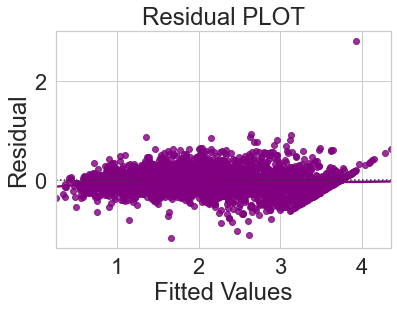

In [84]:
sns.set_style("whitegrid")
sns.residplot(fitted,residual,color="purple",lowess=True)
plt.xlabel("Fitted Values")
plt.ylabel("Residual")
plt.title("Residual PLOT")
plt.show()

- **There is no apparent pattern in this and we can determine it satisfies the test of linearity. **

### **4. TEST FOR HOMOSCEDASTICITY**

- Homoscedacity - If the variance of the residuals are symmetrically distributed across the regression line , then the data is said to homoscedastic.

- **The data, according to the Residual plot above, issymmetrically distributed across the line, thus passing the linear regression condition of homoscedasticity.**

### 5. TEST FOR NORMALITY using the QQ plot and distribution.

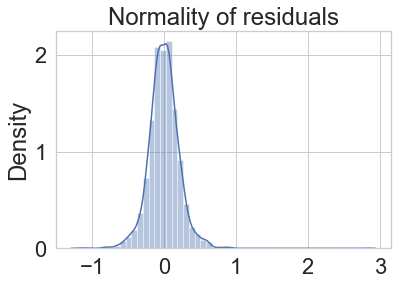

In [85]:
sns.distplot(residual)
plt.title('Normality of residuals')
plt.show()

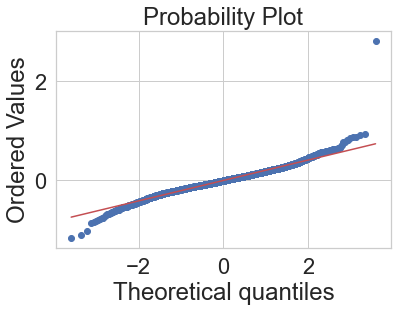

In [86]:
import pylab
import scipy.stats as stats
stats.probplot(residual.flatten(),dist="norm",plot=pylab)
plt.show()

*According to the QQ Plot and distributions, we can determine that the test for Normality has been satisfied.*



### This means all 5 of the linear regression model conditions have been satisfied and we can move forward.

# Updating the test and train data with the new columns after going through the assumptions.

In [87]:
# first we add the constant to test input variables
X_test['constant'] = 1

# Using X_train3 we can get the columns we want to use
X_test_final = X_test[X_train3.columns]

X_test_final.head()

,Year,Mileage,Power,Seats,Kilometers_Driven_log,Brand_Audi,Brand_BMW,Brand_Bentley,Brand_Chevrolet,Brand_Datsun,Brand_Fiat,Brand_Force,Brand_Ford,Brand_Honda,Brand_Hyundai,Brand_ISUZU,Brand_Isuzu,Brand_Jaguar,Brand_Jeep,Brand_Lamborghini,Brand_Land,Brand_Nissan,Brand_Porsche,Brand_Renault,Brand_Skoda,Brand_Smart,Brand_Tata,Brand_Toyota,Brand_Volkswagen,Brand_Volvo,Location_Bangalore,Location_Chennai,Location_Coimbatore,Location_Delhi,Location_Hyderabad,Location_Jaipur,Location_Kochi,Location_Kolkata,Location_Mumbai,Location_Pune,Fuel_Type_Diesel,Fuel_Type_Electric,Fuel_Type_LPG,Transmission_Manual,Owner_Type_Fourth & Above,Owner_Type_Second,Owner_Type_Third,constant
837,2016.000,24.000,70.000,5.000,10.871,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1
2412,2012.000,17.010,121.300,5.000,10.086,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1
2624,2015.000,24.000,70.000,5.000,11.103,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1
2302,2017.000,15.290,121.300,5.000,10.504,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2167,2011.000,16.800,118.000,5.000,10.951,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1


In [88]:
y_pred = lin_reg_model1.predict(X_test_final)

# Performance Check on the Final Model

In [89]:
#Performance check!!
print('Training Performance\n')
print(model_perf(lin_reg_model1, X_train3, y_train))

Training Performance

   RMSE   MAE  MAPE   R^2  Adjusted R^2
0 0.210 0.156 8.681 0.915         0.914


**These values are are a small decrease in comparison to the original training performance, but all the assumptions are satisfied! The linear regression has been fit well for this dataset and can predict with a high accuracy** 

In [90]:
print('Test Performance\n')
print(model_perf(lin_reg_model1, X_test_final, y_test))

Test Performance

   RMSE   MAE  MAPE   R^2  Adjusted R^2
0 0.211 0.158 8.721 0.918         0.915


* **Now we can finally see that we have low test and train error, also both the errors are comparable, so our model is not suffering from overfitting.**

* **Hence we can conclude the model "lin_reg_model1" is good for prediction as well as inference purpose.**


In [91]:
lin_reg_model1 = LinearRegression(fit_intercept=False)
lin_reg_model1.fit(X_train3,y_train)

# let us check the coefficients and intercept of the model

coef_df = pd.DataFrame(lin_reg_model1.coef_.flatten(), \
                       index=X_train3.columns.tolist(), columns=['Coefficients'])
print(coef_df)

# model performance
print('\n\nTraining Performance\n')
print(model_perf(lin_reg_model1, X_train3, y_train))

                           Coefficients
Year                              0.089
Mileage                          -0.014
Power                             0.008
Seats                           -34.155
Kilometers_Driven_log            -0.096
Brand_Audi                        0.179
Brand_BMW                         0.107
Brand_Bentley                     1.109
Brand_Chevrolet                  -0.335
Brand_Datsun                     -0.357
Brand_Fiat                       -0.277
Brand_Force                      -0.009
Brand_Ford                       -0.111
Brand_Honda                      -0.111
Brand_Hyundai                    -0.103
Brand_ISUZU                      -0.383
Brand_Isuzu                      -0.190
Brand_Jaguar                      0.210
Brand_Jeep                       -0.093
Brand_Lamborghini                 0.000
Brand_Land                        0.436
Brand_Nissan                     -0.110
Brand_Porsche                     0.213
Brand_Renault                    -0.120


*The amount of seats in a car seems to be a big factor in how much the car is worth! The more seats you have, the cheaper your car gets.*

## The overall performance of this model was pretty strong. The New_Price column had a large amount of missing values so it was not used in the model as it would have been misleading to the model due to correlation.

**If we want to be specific and see which columns and how many yield the best results, we can go forth with feature selection!**

# Feature Selection for Further Imrpovement

In [92]:
X_train_new = X_train3.drop('constant', axis = 1) #dropping the unncessary column and creating the new train data set

In [93]:

reg = LinearRegression()

# Build step forward feature selection to help determine how many features yield the best results
sfs1 = sfs(reg,k_features = X_train_new.shape[1], forward=True,   # k_features denotes "Number of features to select"
           floating=False, scoring= 'r2',
           verbose=2, cv=5)

# Perform SFFS
sfs1 = sfs1.fit(X_train_new, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  47 out of  47 | elapsed:    0.6s finished

[2021-04-24 07:16:47] Features: 1/47 -- score: 0.6370597555017224[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  46 out of  46 | elapsed:    0.6s finished

[2021-04-24 07:16:48] Features: 2/47 -- score: 0.84571259353617[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    0.5s finished

[2021-04-24 07:16:49] Features: 3/47 -- score: 0.8613643171925516[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1

- *After the 37th feature, the value started to decrease. Let's run this again with the k_features specified to 37 to return the best columns to use*

In [94]:
reg = LinearRegression()

# # Build step forward feature selection
sfs1 = sfs(reg, k_features = 37, forward=True,
           floating=False, scoring='r2',
           verbose=2, cv=5)

# Perform SFFS
sfs1 = sfs1.fit(X_train_new, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  47 out of  47 | elapsed:    0.5s finished

[2021-04-24 07:17:07] Features: 1/37 -- score: 0.6370597555017224[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  46 out of  46 | elapsed:    0.5s finished

[2021-04-24 07:17:08] Features: 2/37 -- score: 0.84571259353617[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    0.5s finished

[2021-04-24 07:17:09] Features: 3/37 -- score: 0.8613643171925516[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1

In [95]:
# Now Which features are important? We can extract that to an index and use it to show us which columns the tool recommends!
feat_cols = list(sfs1.k_feature_idx_)
print(feat_cols)

[0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 12, 13, 14, 15, 17, 18, 19, 20, 21, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 37, 38, 40, 41, 43, 45, 46]


In [96]:
X_train3.columns[feat_cols]

Index(['Year', 'Mileage', 'Power', 'Seats', 'Kilometers_Driven_log',
       'Brand_Audi', 'Brand_BMW', 'Brand_Chevrolet', 'Brand_Datsun',
       'Brand_Fiat', 'Brand_Ford', 'Brand_Honda', 'Brand_Hyundai',
       'Brand_ISUZU', 'Brand_Jaguar', 'Brand_Jeep', 'Brand_Lamborghini',
       'Brand_Land', 'Brand_Nissan', 'Brand_Renault', 'Brand_Skoda',
       'Brand_Smart', 'Brand_Tata', 'Brand_Toyota', 'Brand_Volkswagen',
       'Location_Bangalore', 'Location_Chennai', 'Location_Coimbatore',
       'Location_Delhi', 'Location_Hyderabad', 'Location_Kolkata',
       'Location_Mumbai', 'Fuel_Type_Diesel', 'Fuel_Type_Electric',
       'Transmission_Manual', 'Owner_Type_Second', 'Owner_Type_Third'],
      dtype='object')

In [97]:
X_train_final = X_train3[X_train3.columns[feat_cols]]

In [98]:
#Creating new x_test with the same 37 variables that we selected for x_train
X_test_final = X_test[X_train_final.columns]

In [99]:
#Fitting a new linear model to see how these do in the model
lin_reg_model2 = LinearRegression()
lin_reg_model2.fit(X_train_final,y_train)

# let us check the coefficients and intercept of the model

coef_df = pd.DataFrame(np.append(lin_reg_model2.coef_.flatten(), lin_reg_model2.intercept_), \
                       index=X_train_final.columns.tolist()+['Intercept'], columns=['Coefficients'])
print(coef_df)

# model performance on train set
print('\n\nTraining Performance\n')
print(model_perf(lin_reg_model2, X_train_final, y_train))

                       Coefficients
Year                          0.089
Mileage                      -0.014
Power                         0.008
Seats                         0.000
Kilometers_Driven_log        -0.097
Brand_Audi                    0.172
Brand_BMW                     0.097
Brand_Chevrolet              -0.337
Brand_Datsun                 -0.357
Brand_Fiat                   -0.278
Brand_Ford                   -0.111
Brand_Honda                  -0.114
Brand_Hyundai                -0.104
Brand_ISUZU                  -0.377
Brand_Jaguar                  0.200
Brand_Jeep                   -0.098
Brand_Lamborghini            -0.000
Brand_Land                    0.431
Brand_Nissan                 -0.110
Brand_Renault                -0.120
Brand_Skoda                  -0.127
Brand_Smart                  -0.300
Brand_Tata                   -0.400
Brand_Toyota                  0.133
Brand_Volkswagen             -0.121
Location_Bangalore            0.129
Location_Chennai            

In [100]:
# model performance on test set
print('Test Performance\n')
print(model_perf(lin_reg_model2, X_test_final, y_test))

Test Performance

   RMSE   MAE  MAPE   R^2  Adjusted R^2
0 0.211 0.158 8.696 0.918         0.916


* **We were able to remove 6 columns while retaining the same performance results using this method!**

* **Both R^2 score and RMSE show that the model fitted is good, without any overfitting.**
* **The results from the feature selection vs our last model we created has less than a 1% difference in the performance values!**
